## Exploratory data analysis:

In [2]:
import numpy as np
import pandas as pd
import datetime
import ast
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_theme()
from importlib import reload

# Silencing a Pandas warning about date parsing
import warnings
warnings.filterwarnings("ignore", message="Could not infer format")

### Sorting by lobbying issue code

To properly start looking at the lobbying data, we need to understand the lobbying codes and sort by them. Here is a dictionary called `issue_codes` relating the issue codes appearing in the lobbying filings to their meanings - it's lifted from https://lda.congress.gov/ld/help/default.htm?turl=Documents%2FAppCodes.htm.

In [3]:
issue_codes={
    'ACC': 'Accounting',
    'ADV': 'Advertising',
    'AER': 'Aerospace',
    'AGR': 'Agriculture',
    'ALC': 'Alcohol & Drug Abuse',
    'ANI': 'Animals',
    'APP': 'Apparel/Clothing Industry/Textiles',
    'ART': 'Arts/Entertainment',
    'AUT': 'Automotive Industry',
    'AVI': 'Aviation/Aircraft/Airlines',
    'BAN': 'Banking',
    'BNK': 'Bankruptcy',
    'BEV': 'Beverage Industry',
    'BUD': 'Budget/Appropriations',
    'CAW': 'Clean Air & Water (Quality)',
    'CDT': 'Commodities (Big Ticket)',
    'CHM': 'Chemicals/Chemical Industry',
    'CIV': 'Civil Rights/Civil Liberties',
    'COM': 'Communications/Broadcasting/Radio/TV',
    'CPI': 'Computer Industry',
    'CSP': 'Consumer Issues/Safety/Protection',
    'CON': 'Constitution',
    'CPT': 'Copyright/Patent/Trademark',
    'DEF': 'Defense',
    'DOC': 'District of Columbia',
    'DIS': 'Disaster Planning/Emergencies',
    'ECN': 'Economics/Economic Development',
    'EDU': 'Education',
    'ENG': 'Energy/Nuclear',
    'ENV': 'Environmental/Superfund',
    'FAM': 'Family Issues/Abortion/Adoption',
    'FIR': 'Firearms/Guns/Ammunition',
    'FIN': 'Financial Institutions/Investments/Securities',
    'FOO': 'Food Industry (Safety, Labeling, etc.)',
    'FOR': 'Foreign Relations',
    'FUE': 'Fuel/Gas/Oil',
    'GAM': 'Gaming/Gambling/Casino',
    'GOV': 'Government Issues',
    'HCR': 'Health Issues',
    'HOM': 'Homeland Security',
    'HOU': 'Housing',
    'IMM': 'Immigration',
    'IND': 'Indian/Native American Affairs',
    'INS': 'Insurance',
    'LBR': 'Labor Issues/Antitrust/Workplace',
    'INT': 'Intelligence and Surveillance',
    'LAW': 'Law Enforcement/Crime/Criminal Justice',
    'MAN': 'Manufacturing',
    'MAR': 'Marine/Maritime/Boating/Fisheries',
    'MED': 'Medical/Disease Research/Clinical Labs',
    'MIA': 'Media (Information/Publishing)',
    'MMM': 'Medicare/Medicaid',
    'MON': 'Minting/Money/Gold Standard',
    'NAT': 'Natural Resources',
    'PHA': 'Pharmacy',
    'POS': 'Postal',
    'RRR': 'Railroads',
    'RES': 'Real Estate/Land Use/Conservation',
    'REL': 'Religion',
    'RET': 'Retirement',
    'ROD': 'Roads/Highway',
    'SCI': 'Science/Technology',
    'SMB': 'Small Business',
    'SPO': 'Sports/Athletics',
    'TAR': 'Miscellaneous Tariff Bills',
    'TAX': 'Taxation/Internal Revenue Code',
    'TEC': 'Telecommunications',
    'TOB': 'Tobacco',
    'TOR': 'Torts',
    'TRD': 'Trade (Domestic & Foreign)',
    'TRA': 'Transportation',
    'TOU': 'Travel/Tourism',
    'TRU': 'Trucking/Shipping',
    'URB': 'Urban Development/Municipalities',
    'UNM': 'Unemployment',
    'UTI': 'Utilities',
    'VET': 'Veterans',
    'WAS': 'Waste (hazardous/solid/interstate/nuclear)',
    'WEL': 'Welfare'
}

Compare this to the sector breakdown Paul attached to the stock data.

In [72]:
sectors=pd.read_csv("trading_data/stock_sectors.csv", header=None).drop(sectors[sectors[0]=='Not Found'].index)
list(sectors[0])


['Advertising Agencies',
 'Aerospace & Defense',
 'Agricultural Inputs',
 'Airlines',
 'Airports & Air Services',
 'Aluminum',
 'Apparel Manufacturing',
 'Apparel Retail',
 'Asset Management',
 'Auto & Truck Dealerships',
 'Auto Manufacturers',
 'Auto Parts',
 'Banks - Diversified',
 'Banks - Regional',
 'Beverages - Brewers',
 'Beverages - Non-Alcoholic',
 'Beverages - Wineries & Distilleries',
 'Biotechnology',
 'Broadcasting',
 'Building Materials',
 'Building Products & Equipment',
 'Business Equipment & Supplies',
 'Capital Markets',
 'Chemicals',
 'Coking Coal',
 'Communication Equipment',
 'Computer Hardware',
 'Confectioners',
 'Conglomerates',
 'Consulting Services',
 'Consumer Electronics',
 'Copper',
 'Credit Services',
 'Department Stores',
 'Diagnostics & Research',
 'Discount Stores',
 'Drug Manufacturers - General',
 'Drug Manufacturers - Specialty & Generic',
 'Education & Training Services',
 'Electrical Equipment & Parts',
 'Electronic Components',
 'Electronic Gaming

This comparison is by no means one-to-one. However, there are definitely some lobbying issue codes that strongly match a portfolio of industry sectors. Paul did a bit of matching codes to one another - it's in `./trading_data/sector2lobbyingcode.csv`. I'll use it in a second.

No matter what though, we should start by breaking down the data by issue codes. First, we can keep track of filing period by returning the appropriate start and end date.

In [58]:
def filing_period_start(year,quarter):
    if quarter=='1':
        start= datetime.date(year=year, month=1, day=1)
    if quarter=='2':
        start= datetime.date(year=year, month=4, day=1)
    if quarter=='3':
        start= datetime.date(year=year, month=7, day=1)
    if quarter=='4':
        start= datetime.date(year=year, month=10, day=1)
    return start

def filing_period_end(year,quarter):
    if quarter=='1':
        d= datetime.date(year=year, month=3, day=31)
    if quarter=='2':
        d= datetime.date(year=year, month=6, day=30)
    if quarter=='3':
        d= datetime.date(year=year, month=9, day=30)
    if quarter=='4':
        d= datetime.date(year=year, month=12, day=31)
    return d


In [60]:
years=range(2013,2024) # I omit the 2024 data for now - maybe we redownload this and clean it, since it must have been updated by now to include a full reporting of Q1 information.
quarters=[str(i) for i in range(1,5)]
lobbying=pd.DataFrame()
for year in years:
    for quarter in quarters:
        df=pd.read_csv("lobbying_data/by_quarter/filings_"+str(year)+"Q"+quarter+".csv")
        df['period_start']=filing_period_start(year, quarter)
        df['period_end']=filing_period_end(year, quarter)
        lobbying=pd.concat([lobbying, df])

Let me export this as a single file, so that in the future we don't have to load in the lobbying data one quarter or issue code at a time.

In [62]:
lobbying.to_csv("lobbying_data/filings_all.csv", index=False)

In [63]:
lobbying.info()

<class 'pandas.core.frame.DataFrame'>
Index: 810672 entries, 0 to 21600
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   registrant                810672 non-null  object 
 1   client                    810672 non-null  object 
 2   income                    810672 non-null  float64
 3   expenses                  810672 non-null  float64
 4   issue_codes               810672 non-null  object 
 5   entities_lobbied          810672 non-null  object 
 6   lobbying_description      810672 non-null  object 
 7   foreign_entities          810672 non-null  object 
 8   affiliated_organizations  810672 non-null  object 
 9   JACK_conviction           810672 non-null  bool   
 10  filing_uuid               810672 non-null  object 
 11  filing_type               810672 non-null  object 
 12  expenses_method           810672 non-null  object 
 13  dt_posted                 810672 non-null  object 

When we sort by issue code, we will ignore all filings with no attached codes.

In [18]:
no_codes=lobbying.loc[lobbying.issue_codes=="[]"].copy()

In [19]:
no_codes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116082 entries, 2 to 21599
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   registrant                116082 non-null  object 
 1   client                    116082 non-null  object 
 2   income                    116082 non-null  float64
 3   expenses                  116082 non-null  float64
 4   issue_codes               116082 non-null  object 
 5   entities_lobbied          116082 non-null  object 
 6   lobbying_description      116082 non-null  object 
 7   foreign_entities          116082 non-null  object 
 8   affiliated_organizations  116082 non-null  object 
 9   JACK_conviction           116082 non-null  bool   
 10  filing_uuid               116082 non-null  object 
 11  filing_type               116082 non-null  object 
 12  expenses_method           116082 non-null  object 
 13  dt_posted                 116082 non-null  object 

It's about $1/8$ of the total filings! How much is it by spending?

In [65]:
spending=np.sum(lobbying['expenses'])+np.sum(lobbying['income'])
spending_no_codes=np.sum(no_codes['expenses'])+np.sum(no_codes['income'])
print(spending_no_codes/spending)

0.010480280681845748


It's only around 1% of total spending. I don't feel too bad about ignoring this then.

In [21]:
only_codes=pd.concat([lobbying,no_codes]).drop_duplicates(keep=False)

In [30]:
only_codes.info()

<class 'pandas.core.frame.DataFrame'>
Index: 694590 entries, 0 to 21600
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   registrant                694590 non-null  object 
 1   client                    694590 non-null  object 
 2   income                    694590 non-null  float64
 3   expenses                  694590 non-null  float64
 4   issue_codes               694590 non-null  object 
 5   entities_lobbied          694590 non-null  object 
 6   lobbying_description      694590 non-null  object 
 7   foreign_entities          694590 non-null  object 
 8   affiliated_organizations  694590 non-null  object 
 9   JACK_conviction           694590 non-null  bool   
 10  filing_uuid               694590 non-null  object 
 11  filing_type               694590 non-null  object 
 12  expenses_method           694590 non-null  object 
 13  dt_posted                 694590 non-null  object 

In [32]:
issue_list=[ast.literal_eval(only_codes.iloc[i]['issue_codes']) for i in range(len(only_codes))]

In [33]:
only_codes['issue_codes']=issue_list

In [37]:

in_bool=[('ACC' in only_codes.iloc[i]['issue_codes']) for i in range(len(only_codes))]

In [38]:
only_codes.loc[in_bool]

,registrant,client,income,expenses,issue_codes,entities_lobbied,lobbying_description,foreign_entities,affiliated_organizations,JACK_conviction,filing_uuid,filing_type,expenses_method,dt_posted,reg_id,cl_id,period_start,period_end
430,CHS INC.,"CHS, INC",0.0,40000.00,"[ACC, ENG, BAN, AGR, TRA, TAX]","['HOUSE OF REPRESENTATIVES', 'SENATE']","['LIFO', 'RIN issue', 'End user use of derivat...",[],[],False,9095f6ef-3754-4f12-a794-af4598c36598,Q1,a,2013-04-04 14:58:54.537,286451,176515,2013-01-01,2013-03-31
443,"THE VELASQUEZ GROUP, L.L.C.",KPMG LLP,80000.0,0.00,[ACC],"['HOUSE OF REPRESENTATIVES', 'SENATE']",['Monitoring for would be legislative provisio...,[],[],False,caf4965d-4c2b-4376-b06f-d90a28cb0671,Q1,0,2013-04-04 20:34:21.480,53403,158245,2013-01-01,2013-03-31
619,UNIVERSITY OF IOWA,UNIVERSITY OF IOWA,0.0,29312.86,"[BAN, ENV, SPO, ACC, GOV, ROD, UTI, AGR, WAS, ...","['Agriculture, Dept of (USDA)', 'Centers For M...",['Implementation of the Higher Education Act a...,[],[],False,d15d1944-6d6b-4b94-9a3c-4cc502798711,Q1,a,2013-04-08 11:14:59.307,49191,156117,2013-01-01,2013-03-31
986,DALY CONSULTING GROUP,PWC US GROUP LLP (FORMERLY PRICEWATERHOUSECOOP...,45000.0,0.00,[ACC],"['HOUSE OF REPRESENTATIVES', 'SENATE', 'Securi...",['Issues related to the accounting profession.'],[],[],False,44ae954d-4525-49fe-8142-db98c67b3511,Q1,0,2013-04-09 17:27:14.800,400923683,196221,2013-01-01,2013-03-31
999,JULEANNA GLOVER,AICPA,15000.0,0.00,[ACC],['HOUSE OF REPRESENTATIVES'],['Mobile Workforce Act'],[],[],False,5712e1a9-4612-4774-a421-b235dfc8e46a,Q1,0,2013-04-09 18:23:24.117,298934,180103,2013-01-01,2013-03-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20182,MARKQUEST,MARKQUEST,0.0,1.00,"[TAX, ACC, FOO, BEV, DEF]","['Army, Dept of (Other)', 'Defense Commissary ...","['business expenses', 'how to treat business e...",[],[],False,57b46505-bf3b-497a-9e3a-cbf585c60c1a,Q4,A,2024-01-31 12:18:13,65932,162929,2023-10-01,2023-12-31
20185,MARKQUEST,KASICH COMPANY,1.0,0.00,"[TAX, SMB, ACC]","['HOUSE OF REPRESENTATIVES', 'SENATE']","['tax relief for business', 'business relief',...",[],[],False,f1a4db02-61e9-4ca7-9fe5-45ffcb6e47d9,Q4,0,2024-01-31 12:22:27,65932,204573,2023-10-01,2023-12-31
20506,THE WILLIAMS GROUP,FINANCIAL ACCOUNTING FOUNDATION,45000.0,0.00,[ACC],"['HOUSE OF REPRESENTATIVES', 'SENATE', 'Securi...",['Issues relating to the formulation and devel...,[],[],False,6f552393-10cc-4577-b5d5-96f9dfa63446,Q4,0,2024-02-05 12:36:53,401104049,54899,2023-10-01,2023-12-31
20652,THE DLM GROUP,"GENESIS HEALTH CARE, INC.",15000.0,0.00,"[MED, ALC, ACC, HCR, MMM]","['HOUSE OF REPRESENTATIVES', 'Health & Human S...","['no activity', 'Substance abuse funding', 'An...",[],[],False,e8b4951b-7b6e-454c-bc35-05a359bd2b7e,Q4,0,2024-02-05 13:13:13,313794,184703,2023-10-01,2023-12-31


Here, let me export the filings broken up in this way.

In [43]:
for issue in issue_codes.keys():
    issue_bool=[(issue in only_codes.iloc[i]['issue_codes']) for i in range(len(only_codes))]
    lobbying_issue=only_codes.loc[issue_bool].copy()
    lobbying_issue.to_csv("lobbying_data/by_issue_code/filings_"+issue+".csv", index=False)

In [92]:
summary=pd.DataFrame()
for issue in issue_codes.keys():
    issue_bool=[(issue in only_codes.iloc[i]['issue_codes']) for i in range(len(only_codes))]
    lobbying_issue=only_codes.loc[issue_bool].copy()
    lobbying_issue['spending']=lobbying_issue['expenses']+lobbying_issue['income']
    spending_per_quarter=lobbying_issue.groupby(['period_start']).spending.sum()
    summary[issue]=spending_per_quarter

And we export it.

In [99]:
summary.to_csv("lobbying_data/lobbying_totals.csv")

#### One last thing: adding confidence intervals and correcting mean values

In the lobbying data, all reported incomes and expenses are really ranges; similarly for the trading data.
We will make the assumption that, unless specified, the actual values are independent random variables, drawn from the uniform distribution on the appropriate range.

Income or Expenses: numbers reported are not exact, but are rounded to the nearest 10000. In practice, this means:
|Reported value | Range |
------|-------|
|1 | 0-5000 |
|10000 |  5000-15000 |
|20000 | 15000-25000 |
|30000 | 25000-35000 |
|... | ...|

I will assume, if the number given is an even multiple of 5000, then the filer rounded to the nearest 5000 instead of 100000, so could be anywhere in range of length 5000.

Recall that a random variable which is uniformly distributed on an interval $[a,b]$ has mean $\mu=\frac{a+b}{2}$ and variance $\sigma^2=\frac{(b-a)^2}{12}.$ Given independent random variables $X_i$, $i=1,\dots, N$, each of which is uniformly distributed on $[a_i,b_i]$, then if $N$ is large, $\sum_{i=1}^N X_i$ is approximately a normally distributed random variable with mean $\mu=\sum_{i=1}^N \mu_i$ and variance $\sigma^2=\sum_{i=1}^N \sigma_i^2$.

So we introduce a new column to our data, called `spending_variance`, which will keep track of the variance for the sum of `expenses` and `income` (recall one of these is always $0$). 

Here is a function that produces the correct variance, given what bucket income or expenses is reported in.

In [3]:
def bucket_var(x): #x will be df.iloc['expenses']+df.iloc['income']
    if (x!=1) and (x%5000 !=0):
        return 0
    elif x%10000 == 0:
        return (10000**2)/12
    elif (x==1) or (x%5000) == 0:
        return (5000**2)/12
    

And here is a function that adds the `spending_variance` column to a filing dataframe.

In [4]:
def add_spending_variance(df):
    spending_variance=[bucket_var(df.iloc[i]['expenses']+df.iloc[i]['income']) for i in range(len(df))]
    df['spending_variance']=spending_variance
    return df

Finally, here is a function that updates the entries in `expenses` or `income` to accurately be the mean of the bucket their filing describes.

In [5]:
def update_mean(df):
    df.loc[df.income==1, 'income']=2500
    df.loc[df.expenses==1, 'expenses']=2500
    return df

Let's fix the filings by issue code, by quarter, and the `filings_all.csv` file to have these changes. First, `filings_all.csv`.

In [ ]:
lobbying=pd.read_csv("lobbying_data/filings_all.csv")
add_spending_variance(lobbying)
update_mean(lobbying)

In [69]:
lobbying.to_csv("lobbying_data/filings_all.csv", index=False)

OK, now for the filings by issue code.

In [7]:
for issue_code in issue_codes.keys():
    df=pd.read_csv('lobbying_data/by_issue_code/filings_'+issue_code+'.csv')
    add_spending_variance(df)
    update_mean(df)
    df.to_csv('lobbying_data/by_issue_code/filings_'+issue_code+'.csv', index=False)

And by quarter:

In [9]:
years=range(2013,2025)
quarters=range(1,5)
for year in years:
    for quarter in quarters:
        df=pd.read_csv('lobbying_data/by_quarter/filings_'+str(year)+'Q'+str(quarter)+'.csv')
        add_spending_variance(df)
        update_mean(df)
        df.to_csv('lobbying_data/by_quarter/filings_'+str(year)+'Q'+str(quarter)+'.csv', index=False)

The stocks data has the same sort of reporting of ranges.

In [32]:
stocks_cleaned=pd.read_csv("trading_data/stocks_cleaned.csv")
stocks_cleaned['Mean_Trade_Size']=.5*(stocks_cleaned['Min_Trade_Size']+stocks_cleaned['Max_Trade_Size'])
stocks_cleaned['Variance']=((stocks_cleaned['Max_Trade_Size']-stocks_cleaned['Min_Trade_Size'])**2)/12

And we re-export:

In [34]:
stocks_cleaned.to_csv('trading_data/stocks_cleaned.csv', index=False)

I also updated the `lobbying_totals` and `stock_totals` functions in `scripts/data_extraction.py` to return the summed variances, and in the case of stocks, to take `Mean_Trade_Size` as the trade value rather than `Min_Trade_Size`.

### Matching lobbying issue codes to stock sectors

Let's see what Paul has done here.

In [81]:
sec2issue=pd.read_csv("trading_data/sector2lobbyingcode.csv", header=0).fillna(0)
sec2issue.columns=['sector', 'code1', 'code2', 'code3'] #giving the columns names

In [82]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None): 
    display(sec2issue)

,sector,code1,code2,code3
0,Advertising Agencies,ADV,0,0
1,Aerospace & Defense,AER,DEF,0
2,Agricultural Inputs,AGR,0,0
3,Airlines,AVI,TRA,TOU
4,Airports & Air Services,AVI,TRA,TOU
5,Aluminum,NAT,0,0
6,Apparel Manufacturing,APP,0,0
7,Apparel Retail,APP,0,0
8,Asset Management,FIN,0,0
9,Auto & Truck Dealerships,AUT,0,0


In [161]:
one_code=sec2issue.loc[(sec2issue.code2==0) &  (sec2issue.code3==0) & (sec2issue.code1 !=0)]

In [178]:
codes=list(set(one_code['code1'].values))
codes.sort()
codes

['ADV',
 'AGR',
 'APP',
 'ART',
 'AUT',
 'BEV',
 'CHM',
 'CPI',
 'EDU',
 'ENG',
 'FIN',
 'FOO',
 'GAM',
 'HCR',
 'INS',
 'LBR',
 'MAN',
 'NAT',
 'PHA',
 'RES',
 'RRR',
 'SCI',
 'TEC',
 'TOB',
 'TRU',
 'UTI',
 'WAS']

In [179]:
for code in codes:
    print( "'"+code+"'" + " : ", list(one_code.loc[one_code.code1==code]['sector']))

'ADV' :  ['Advertising Agencies']
'AGR' :  ['Agricultural Inputs', 'Farm & Heavy Construction Machinery', 'Farm Products']
'APP' :  ['Apparel Manufacturing', 'Apparel Retail', 'Department Stores', 'Discount Stores', 'Footwear & Accessories', 'Luxury Goods']
'ART' :  ['Electronic Gaming & Multimedia', 'Entertainment', 'Publishing']
'AUT' :  ['Auto & Truck Dealerships', 'Auto Manufacturers', 'Auto Parts', 'Recreational Vehicles']
'BEV' :  ['Beverages - Brewers', 'Beverages - Non-Alcoholic', 'Beverages - Wineries & Distilleries']
'CHM' :  ['Chemicals', 'Specialty Chemicals']
'CPI' :  ['Computer Hardware', 'Consumer Electronics', 'Electronics & Computer Distribution', 'Information Technology Services', 'Software - Application', 'Software - Infrastructure']
'EDU' :  ['Education & Training Services']
'ENG' :  ['Solar']
'FIN' :  ['Asset Management', 'Capital Markets', 'Financial Conglomerates', 'Financial Data & Stock Exchanges']
'FOO' :  ['Confectioners', 'Food Distribution', 'Packaged Foods

In [136]:
sec_one_code=sec2issue.loc[(sec2issue.issue_code_2==0) & (sec2issue.issue_code_3==0)].copy()


OK, looking at Paul's matching, here is a first list of issue codes where there are clear sectors corresponding to them.

In [4]:
cognates={'ADV' :  ['Advertising Agencies'],
          'AGR' :  ['Agricultural Inputs', 'Farm & Heavy Construction Machinery', 'Farm Products'],
          'AUT' :  ['Auto & Truck Dealerships', 'Auto Manufacturers', 'Auto Parts', 'Recreational Vehicles'],
          'BEV' :  ['Beverages - Brewers', 'Beverages - Non-Alcoholic', 'Beverages - Wineries & Distilleries'], 
          'CHM' :  ['Chemicals', 'Specialty Chemicals'], 
          'DEF' :  ['Aerospace & Defense'], #Here I deviate from Paul's choice to include `AER` here as well
          'EDU' :  ['Education & Training Services'],
          'ENG' :  ['Solar'], #`ENG` code does not cover oil and gas, although many oil and gas companies lobby this code.
          'FOO' :  ['Confectioners', 'Food Distribution', 'Packaged Foods'],
          'FUE' :  ['Oil & Gas Drilling', 'Oil & Gas E&P','Oil & Gas Equipment & Services', 'Oil & Gas Integrated', 'Oil & Gas Midstream', 'Oil & Gas Refining & Marketing'],
          'GAM' :  ['Gambling'],
          'INS' :  ['Insurance - Diversified', 'Insurance - Life', 'Insurance - Property & Casualty', 'Insurance - Reinsurance', 'Insurance - Specialty', 'Insurance Brokers'],
          'MAN' :  ['Metal Fabrication', 'Specialty Industrial Machinery', 'Steel', 'Textile Manufacturing'], #I added to this one to match choices Paul made
          'NAT' :  ['Aluminum', 'Copper', 'Lumber & Wood Production', 'Other Industrial Metals & Mining', 'Other Precious Metals & Mining', 'Silver'],
          'PHA' :  ['Drug Manufacturers - General', 'Drug Manufacturers - Specialty & Generic', 'Pharmaceutical Retailers'],
          'RES' :  ['REIT - Diversified', 'REIT - Industrial', 'REIT - Mortgage', 'REIT - Office', 'REIT - Specialty', 'Real Estate - Development', 'Real Estate - Diversified', 'Real Estate Services'],
          'RRR' :  ['Railroads'],
          'TEC' :  ['Telecom Services'],
          'TOB' :  ['Tobacco'],
          'TRU' :  ['Trucking'],
          'UTI' :  ['Utilities - Diversified', 'Utilities - Independent Power Producers', 'Utilities - Regulated Water', 'Utilities - Renewable'] }

In the list above, I manually added some codes that were excluded by the `one_code` game we were using.

`'DEF'` makes me a litle nervous. I'm going to take a second and look at the filings with the `'AER'` issue code, and try to identify how many of these both do not have the `'DEF'` issue code, but do mention defense in their description.

In [38]:
aero=pd.read_csv("lobbying_data/by_issue_code/filings_AER.csv")
defen=pd.read_csv("lobbying_data/by_issue_code/filings_DEF.csv")

In [43]:
aero.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6320 entries, 0 to 6319
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   registrant                6320 non-null   object 
 1   client                    6320 non-null   object 
 2   income                    6320 non-null   float64
 3   expenses                  6320 non-null   float64
 4   issue_codes               6320 non-null   object 
 5   entities_lobbied          6320 non-null   object 
 6   lobbying_description      6320 non-null   object 
 7   foreign_entities          6320 non-null   object 
 8   affiliated_organizations  6320 non-null   object 
 9   JACK_conviction           6320 non-null   bool   
 10  filing_uuid               6320 non-null   object 
 11  filing_type               6320 non-null   object 
 12  expenses_method           6320 non-null   object 
 13  dt_posted                 6320 non-null   object 
 14  reg_id  

In [40]:
aero_no_defen=pd.concat([aero,defen,defen]).drop_duplicates(keep=False)

In [42]:
aero_no_defen

,registrant,client,income,expenses,issue_codes,entities_lobbied,lobbying_description,foreign_entities,affiliated_organizations,JACK_conviction,filing_uuid,filing_type,expenses_method,dt_posted,reg_id,cl_id,period_start,period_end
0,"GEOEYE, INC.","GEOEYE, INC.",0.0,7000.0,['AER'],"['HOUSE OF REPRESENTATIVES', 'SENATE', 'White ...",['Support for US commercial satellite imagery ...,[],[],False,46e4def4-29fc-4e5e-80ae-fc4bdd77c7f8,1T,a,2013-01-30 18:42:54.060,400276319,188822,2013-01-01,2013-03-31
1,SONNY CALLAHAN AND ASSOCIATES,"CITY OF PENSACOLA, FLORIDA",12000.0,0.0,['AER'],"['HOUSE OF REPRESENTATIVES', 'SENATE', 'Transp...","['Liaison with Baldwin County, AL officials, U...",[],[],False,03567205-0d7e-49e7-be82-baedf479682b,Q1,0,2013-04-02 13:30:11.623,81338,171165,2013-01-01,2013-03-31
2,"PARKER, POE, ADAMS & BERNSTEIN LLP","FUENTEK, LLC",1.0,0.0,['AER'],['Natl Aeronautics & Space Administration (NAS...,['Representation regarding support for NASA ap...,[],[],False,20703519-7772-475d-a0ca-e44c2e0a1984,Q1,0,2013-04-02 14:48:29.623,288098,177061,2013-01-01,2013-03-31
3,"NATIONAL GROUP, LLP",ITHACA COLLEGE,20000.0,0.0,"['AER', 'TRA', 'HCR']","['HOUSE OF REPRESENTATIVES', 'Natl Aeronautics...","['Research Funding', 'Highway Funding', 'Resea...",[],[],False,956bad7f-fc80-4a6a-931d-fe75a77cfad6,Q1,0,2013-04-04 10:41:10.777,66090,163279,2013-01-01,2013-03-31
4,"NATIONAL GROUP, LLP",SEA ORBITER,40000.0,0.0,['AER'],['Natl Aeronautics & Space Administration (NAS...,['NASA'],[],[],False,c159aa88-2d62-4c91-8197-834025a0f746,Q1,0,2013-04-04 10:50:20.370,66090,163283,2013-01-01,2013-03-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6311,IKYR LLC,ADVANCED SPACE LLC,20000.0,0.0,['AER'],"['Defense, Dept of (DOD)', 'HOUSE OF REPRESENT...",['Defense Appropriations and authorization'],[],[],False,8b66d49a-dd96-4bfb-863e-4001ace6e513,Q4,0,2024-02-06 11:18:09,401106952,53773,2023-10-01,2023-12-31
6312,IKYR LLC,COGNITIVE SPACE,1.0,0.0,['AER'],"['HOUSE OF REPRESENTATIVES', 'SENATE']","['Artificial Intelligence, NASA, USSF']",[],[],False,d7349f70-e0fd-478a-a939-45cd6de3cdf5,Q4,0,2024-02-06 11:21:33,401106952,58539,2023-10-01,2023-12-31
6313,IKYR LLC,LOFT FEDERAL,1.0,0.0,['AER'],"['HOUSE OF REPRESENTATIVES', 'SENATE']","['NASA, USSF, Space Development Agency']",[],[],False,2e723899-f33d-44e7-a58d-4f77827ff5eb,Q4,0,2024-02-06 11:23:19,401106952,58540,2023-10-01,2023-12-31
6315,KANSAS STATE UNIVERSITY,KANSAS STATE UNIVERSITY,0.0,65540.0,"['ENG', 'MAN', 'AER', 'ECN', 'BUD', 'EDU', 'AGR']","['Agriculture, Dept of (USDA)', 'Energy, Dept ...",['Research opportunities pertaining around ene...,[],[],False,a12be404-58a5-4890-91a4-6623dd393002,Q4,A,2024-02-06 17:29:27,401104168,200891,2023-10-01,2023-12-31


In [46]:
bool=['Defense' in aero_no_defen.iloc[i]['lobbying_description'] for i in range(len(aero_no_defen))]

In [49]:
df=aero_no_defen[bool]

In [54]:
print((sum(df.income)+sum(df.expenses))/(sum(aero.income)+sum(aero.expenses)))
print()
print((sum(df.income)+sum(df.expenses))/(sum(defen.income)+sum(defen.expenses)))

0.020681996227142348

0.004669259371803405


OK, it's a very small proportion of spending in `'AER'` that has this form, and an even smaller proportion of `'DEF'`.

I'm happy with this list of sectors to concentrate on: `cognates`. We may modify it in the future as I take a closer look sector by sector.

#### Remark: No stock data from 2013!

I noticed when loading in the data that there are no recorded trades from 2013!

In [22]:
stocks=pd.read_csv("trading_data/stocks_cleaned.csv", parse_dates = ['Traded', 'Filed', 'Quarter'])
stocks[stocks.Quarter < pd.to_datetime("2014-01-01", format="%Y-%m-%d")]

,Ticker,TickerType,Company,Traded,Transaction,Subholding,Description,Name,Filed,Party,...,Quarter,Sector,Industry,YFQuoteType,Category1,Category2,Category3,Codes,Mean_Trade_Size,Variance


I looked into this a bit. The STOCK act was passed in 2012, so congresspeople should have been reporting trading by 2013. My first thought was that initial enforcement of this may have been lax, or that congresspeople did not take the reporting requirement seriously. However, I think it is actually that the STOCK act was amended in 2013 to remove the requirement to report financial disclosures electronically. In fact, because of this amendment the electronic reporting system only came online in January 2014: see https://www.opensecrets.org/news/2013/04/senate-guts-stock-act/, which states:
 "Under the Senate bill, electronic filing would be available but optional, and the system would be delayed until January 2014."

This leaves open an interesting point. We sourced our trading data from QuiverQuant. Presumably they extracted trading data from financial disclosures -- but did they only scrape the electronic filings? There should also be paper filings, which are possibly available as online. For later analysis, this should definitely be looked into.

## Some EDA: how does lobbying affect trading, sector by sector?

We reserve data from the start of 2023 onwards as a test set. The train-test split is already implemented in the python scripts in `scripts/data_extraction.py`.

As mentioned above, we should remove trading data from 2013 from consideration (i.e. drop a bunch of zeros).

#### Lobbying and stocks for `cognates`: plots and autocorrelations

In [5]:
import scripts.data_extraction
reload(scripts.data_extraction)
from scripts.data_extraction import stock_and_lobbying_totals

#### Plots

In [6]:
import statsmodels.api as sm

The following plots lobbying and trading totals over each issue code in `cognates`. The top row of every plot is just the totals over time; the second is the autocorrelation function; the third is the partial autocorrelation.

In [26]:
key='ADV'
totals= stock_and_lobbying_totals(key, cognates[key])
totals.columns

Index(['lobbying_income', 'lobbying_expenses', 'lobbying_income_variance',
       'lobbying_expenses_variance', 'lobbying_spending_variance',
       'lobbying_num_income', 'lobbying_num_expenses', 'lobbying_num',
       'lobbying_total', 'stocks_purchase', 'stocks_sale', 'stocks_gross',
       'stocks_net', 'stocks_gross_frac', 'stocks_purchase_variance',
       'stocks_sale_variance', 'stocks_gross_variance', 'stocks_num_purchase',
       'stocks_num_sale', 'stocks_num'],
      dtype='object')

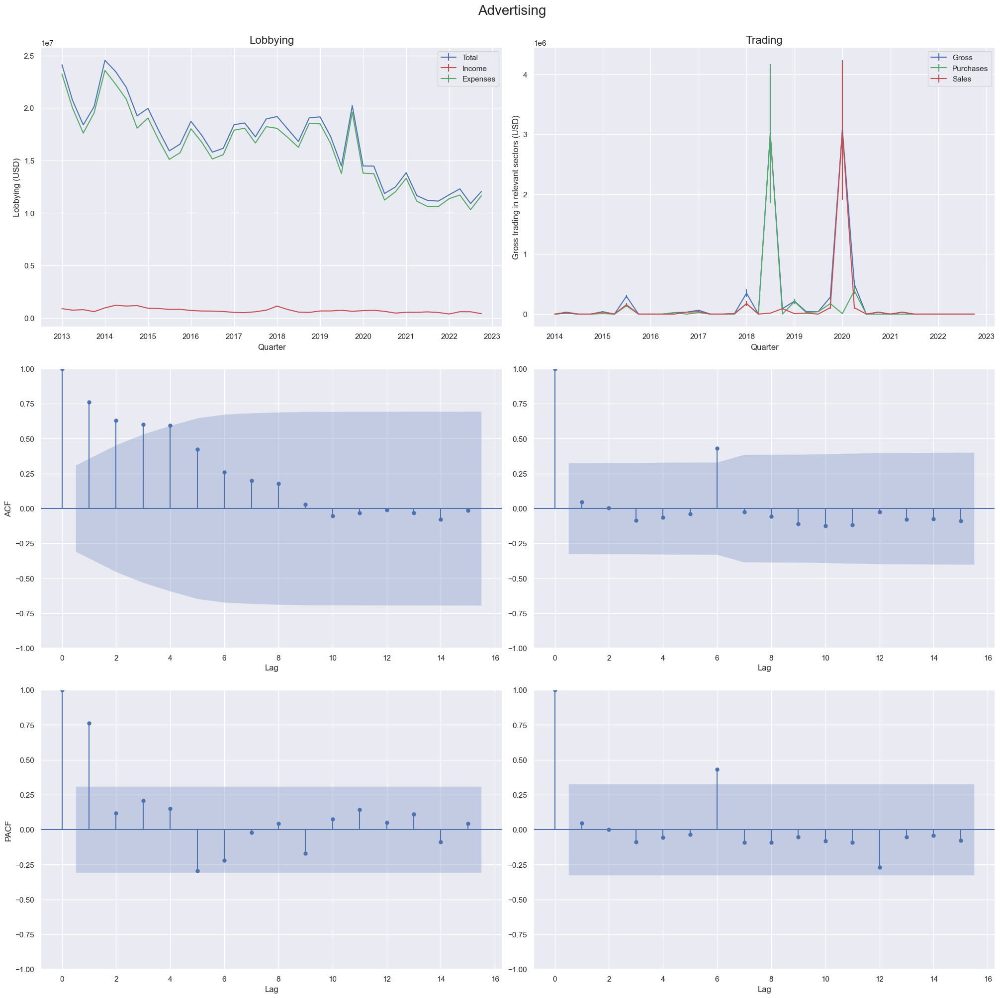

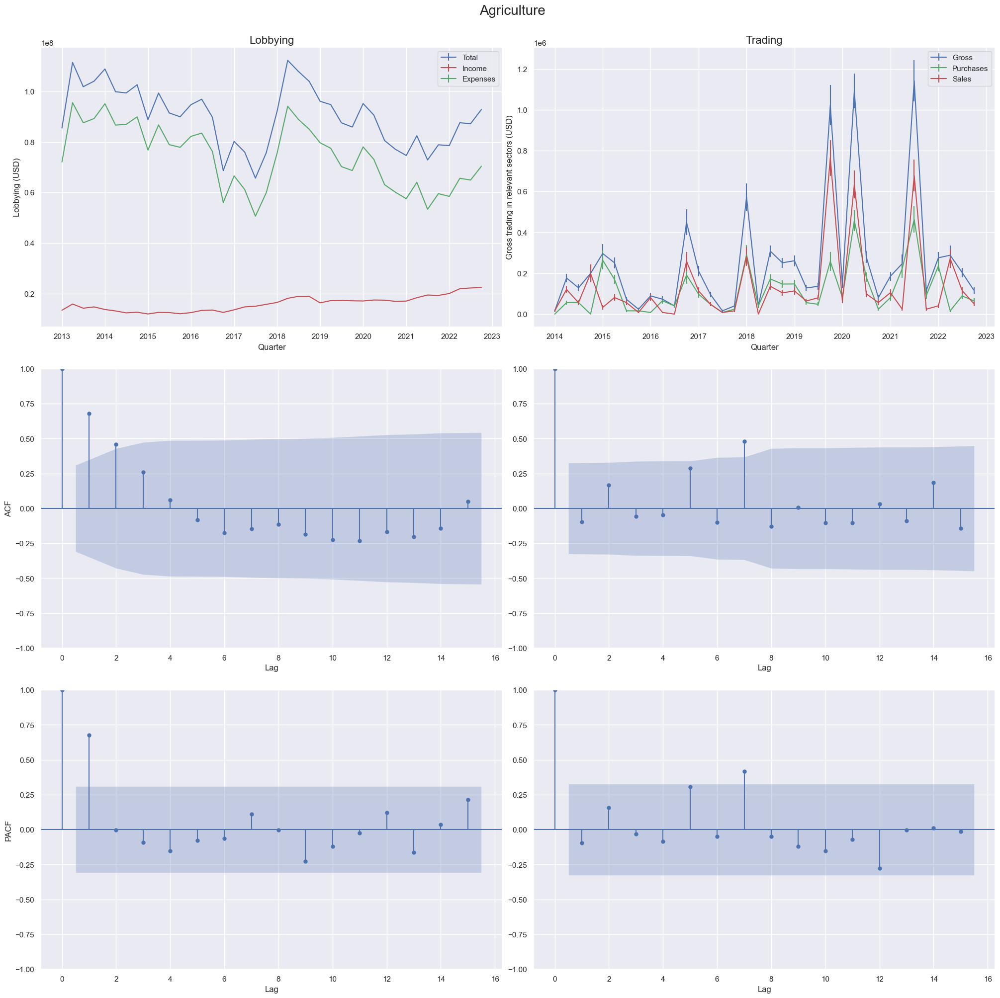

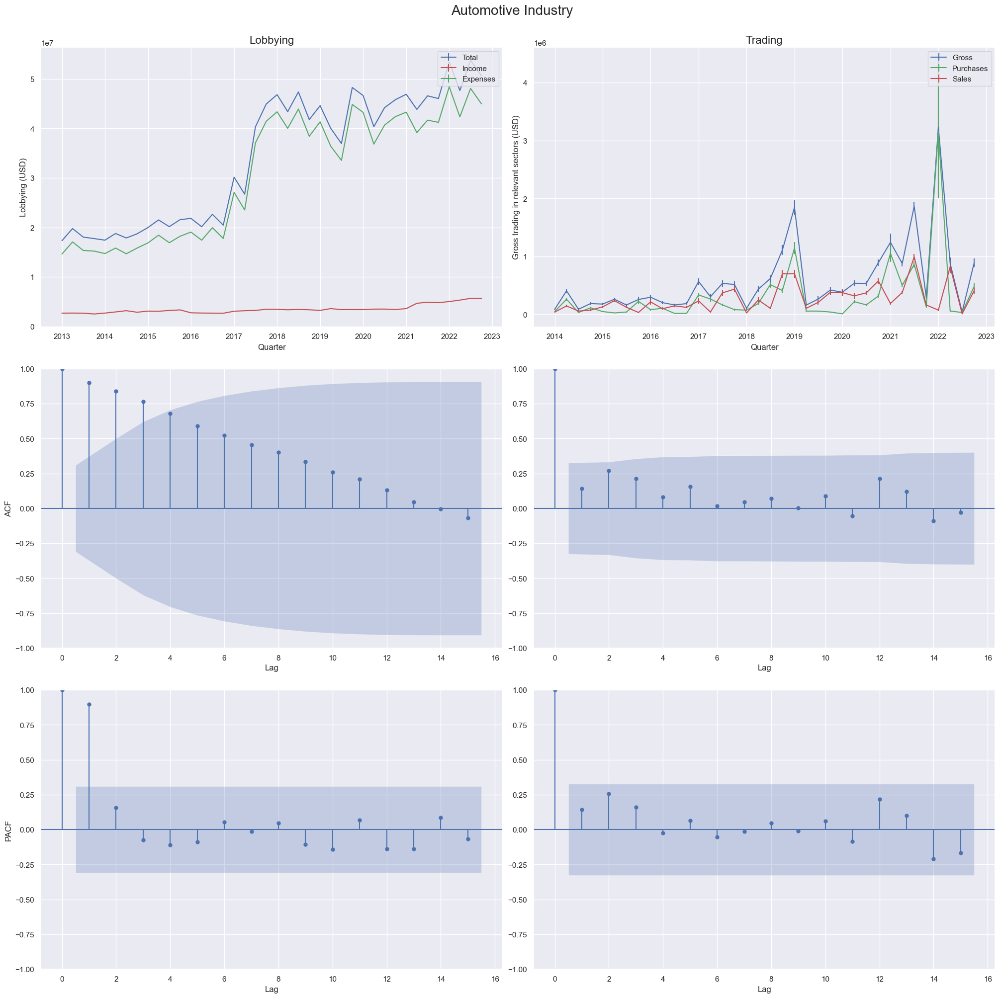

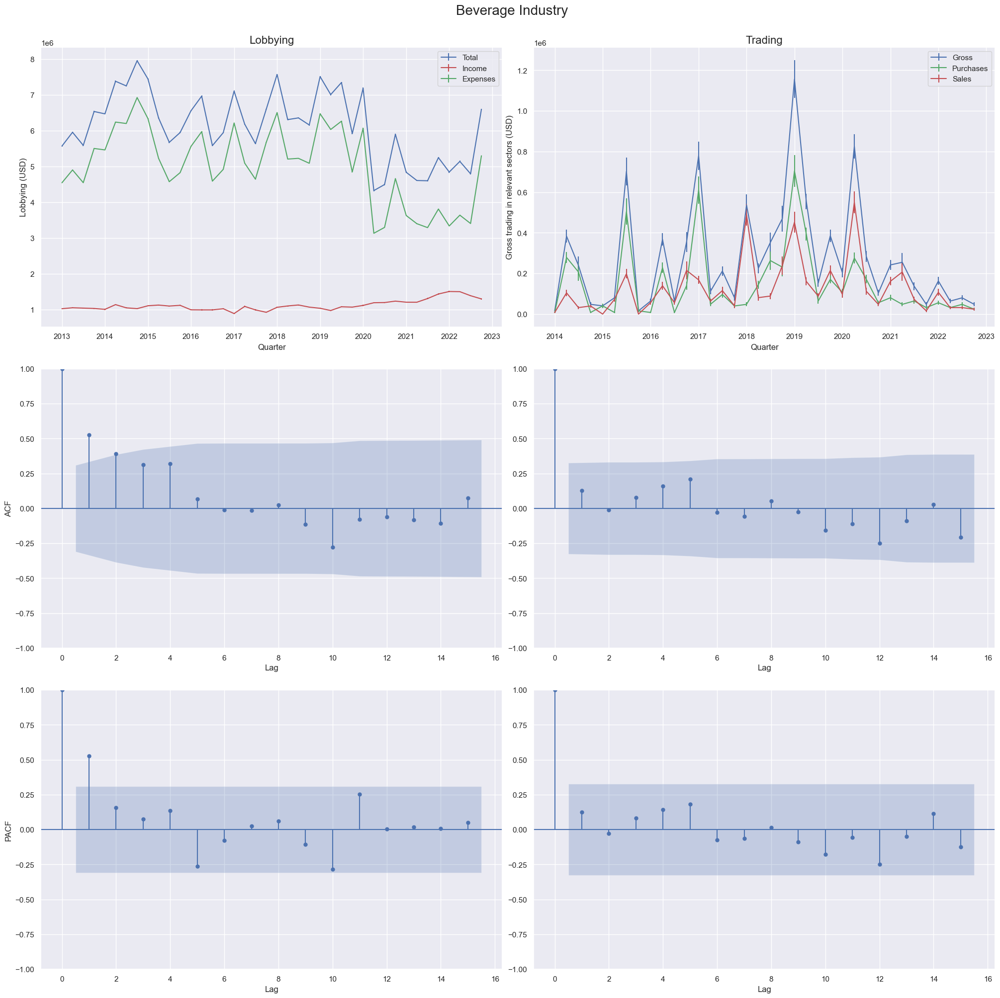

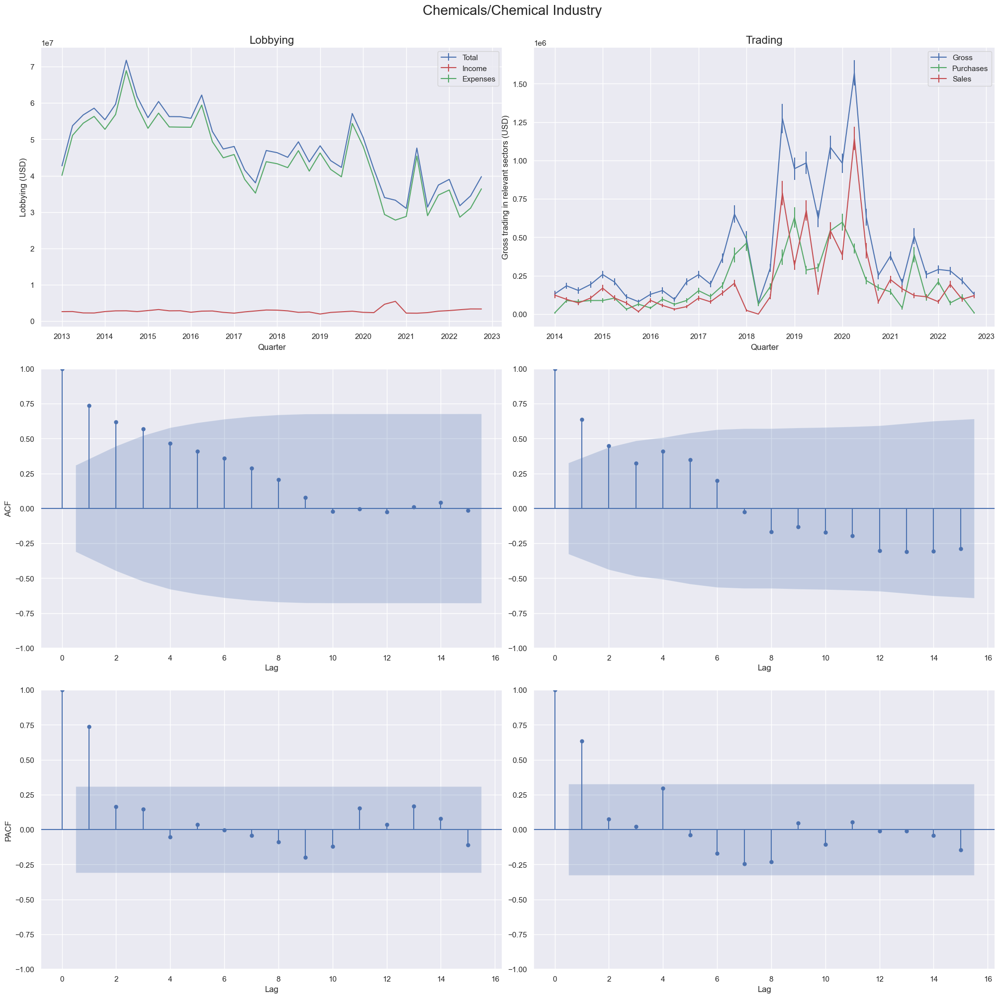

...

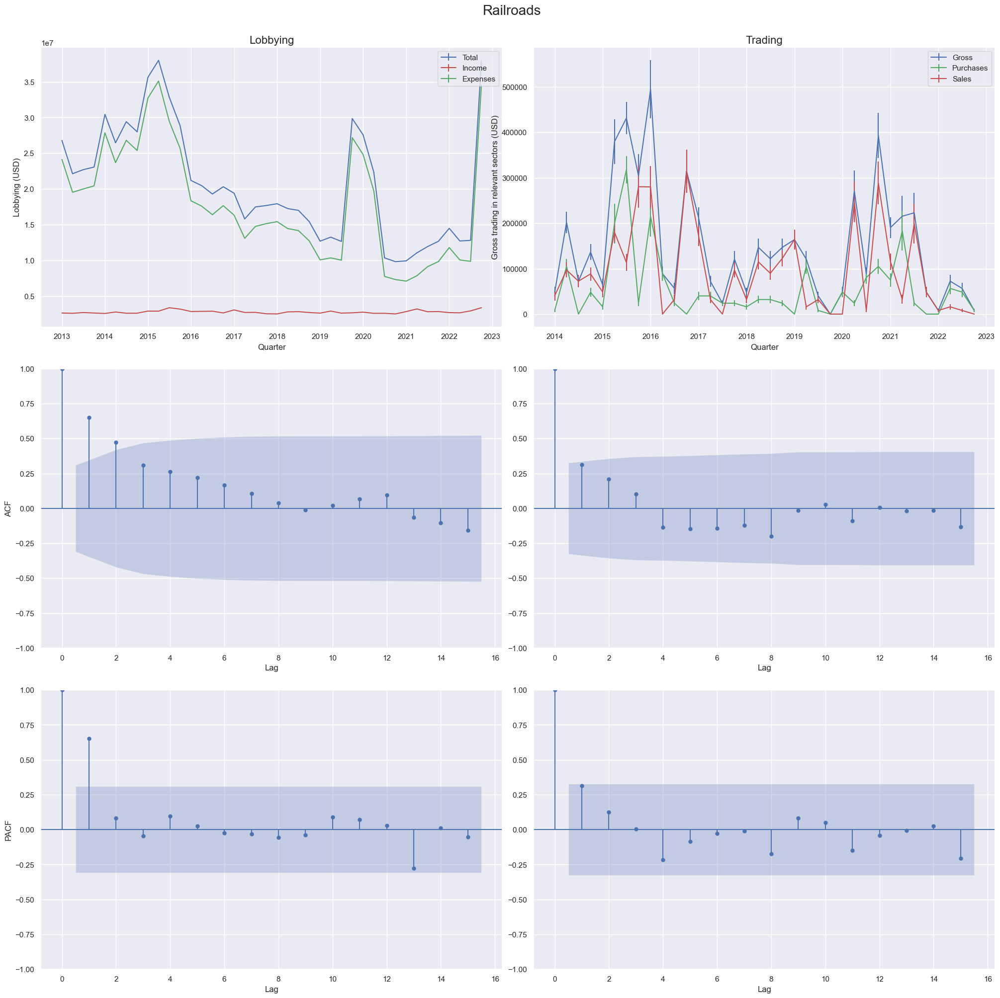

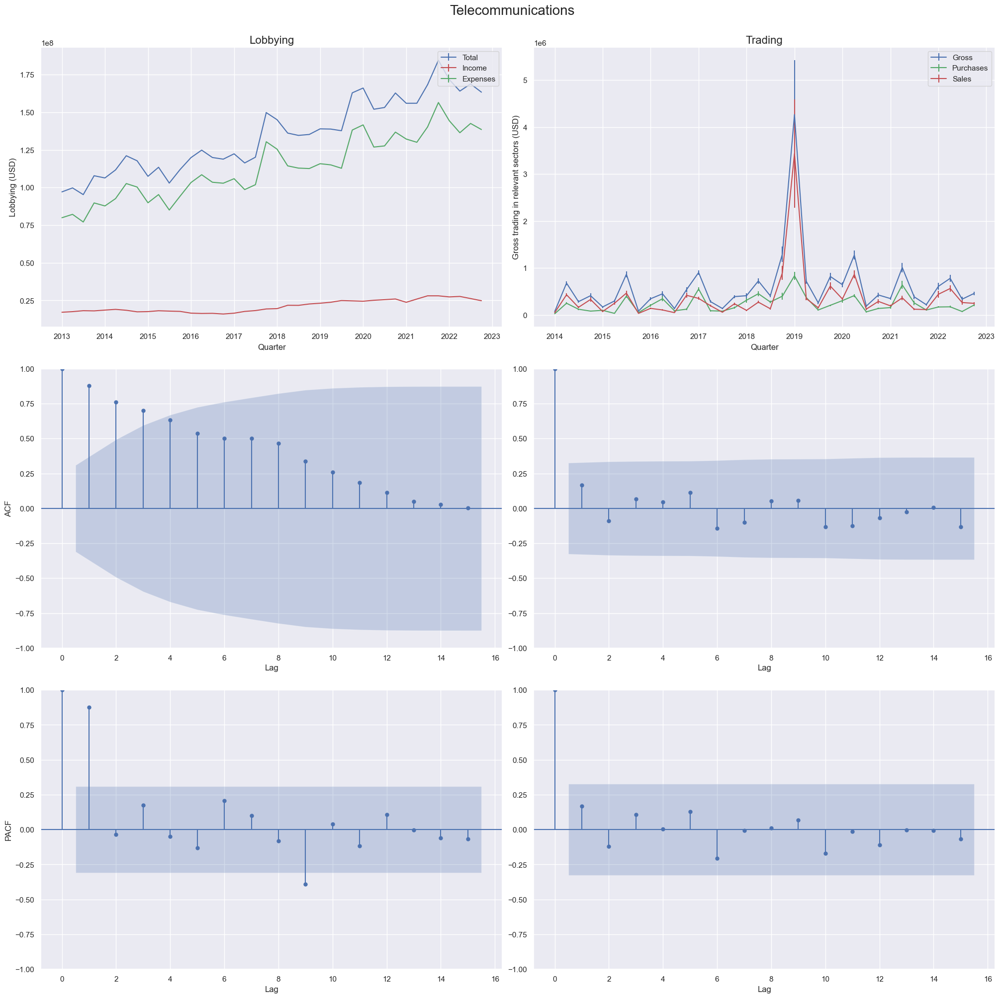

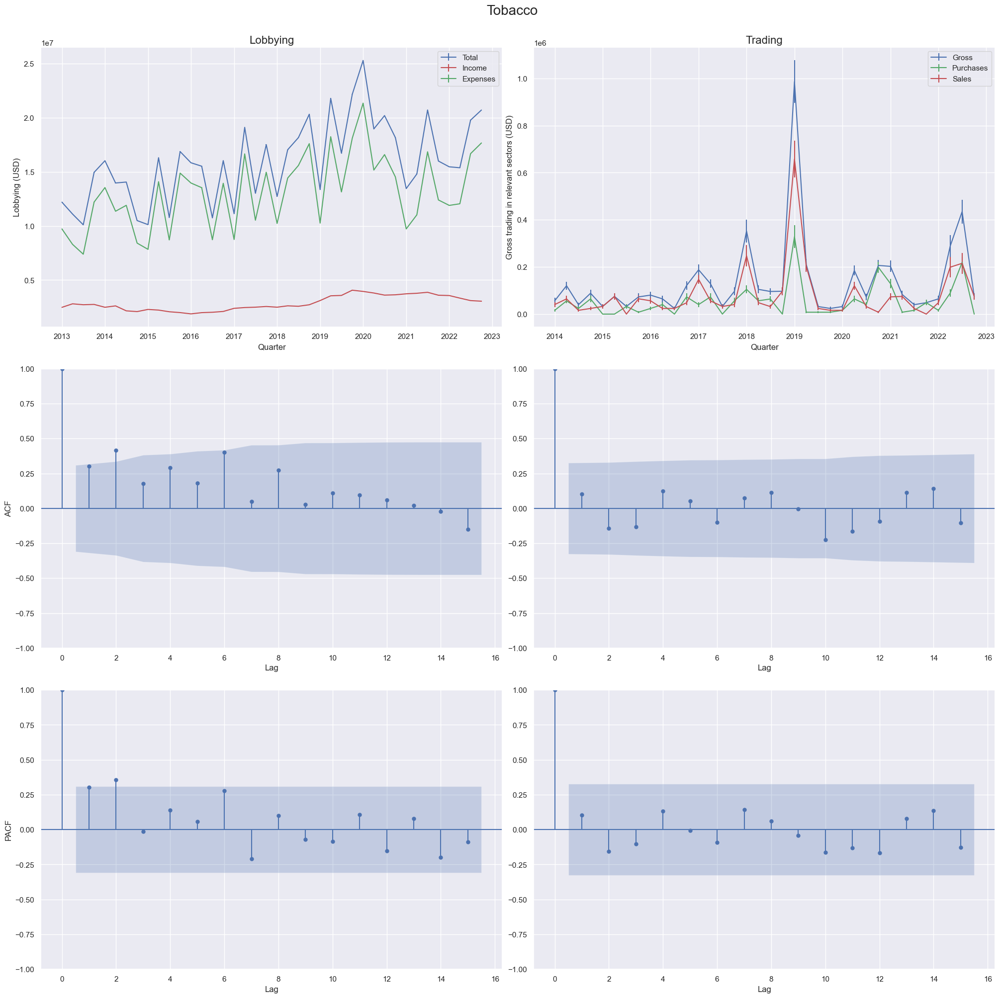

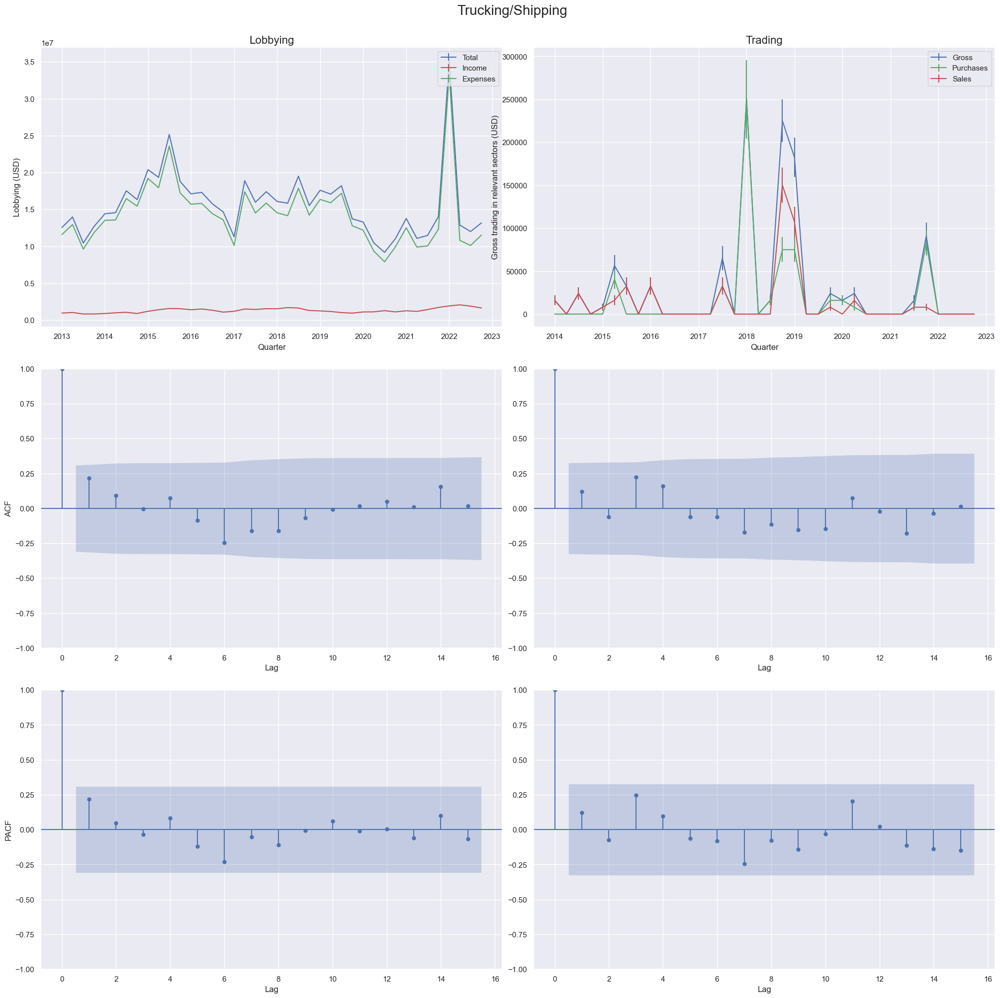

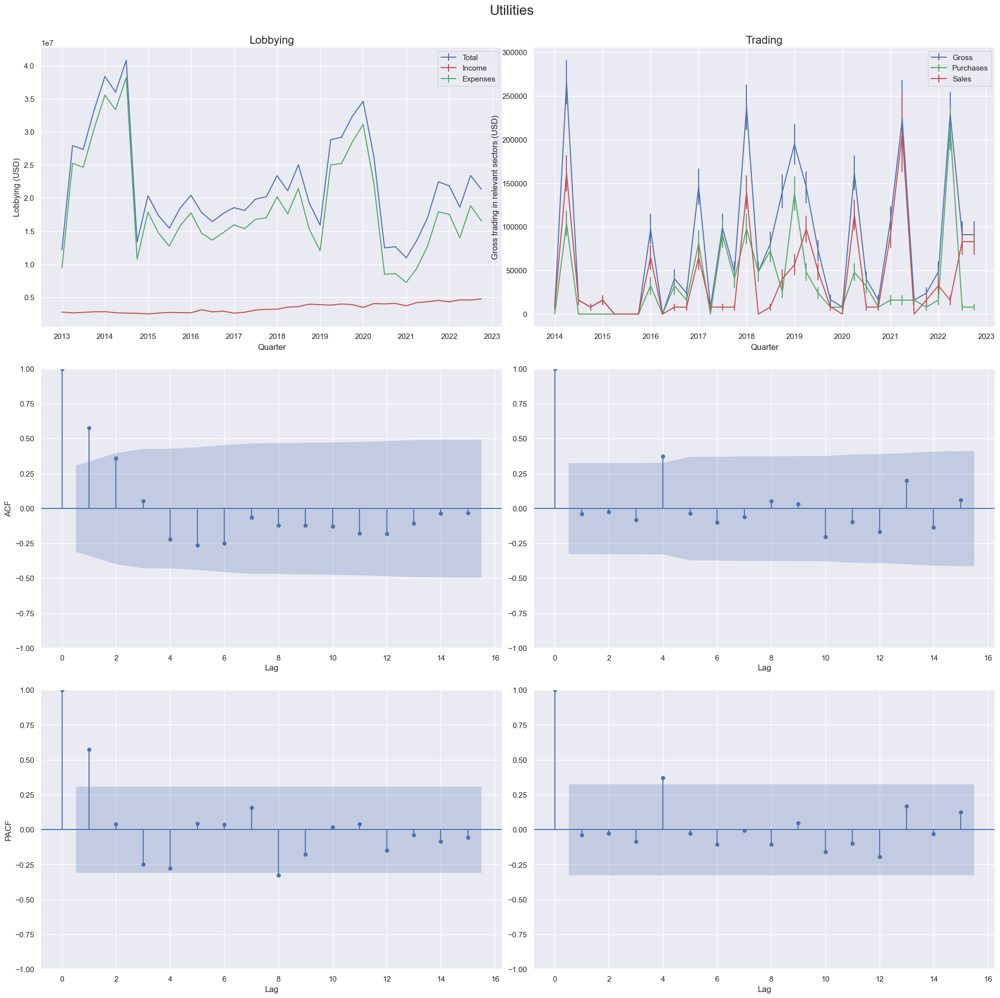

In [29]:
for key in list(cognates.keys()):
    totals= stock_and_lobbying_totals(key, cognates[key])
    fig, axs = plt.subplots(3  , 2, figsize=(20,20))
    fig.suptitle(issue_codes[key], ha='center',va='bottom', fontsize=20)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95, hspace=.15)
    axs[0,0].errorbar(x=totals.index,y=totals.lobbying_total,yerr=totals.lobbying_spending_variance.pow(1/2), label='Total', ls='-', c='b')
    axs[0,0].errorbar(totals.index, totals.lobbying_income, yerr=totals.lobbying_income_variance.pow(1/2), label='Income', ls='-', c='r')
    axs[0,0].errorbar(totals.index, totals.lobbying_expenses, yerr=totals.lobbying_expenses_variance.pow(1/2), label='Expenses', ls='-', c='g')
    axs[0,0].set_title("Lobbying", fontsize=16)
    axs[0,0].set_ylabel("Lobbying (USD)")
    axs[0,0].set_xlabel("Quarter")
    axs[0,0].legend(loc="upper right")
    axs[0,1].errorbar(totals.index[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")], totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_gross, yerr=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_gross_variance.pow(1/2), label='Gross', ls='-', c='b')
    axs[0,1].errorbar(totals.index[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")], totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_purchase, yerr=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_purchase_variance.pow(1/2), label='Purchases', ls='-', c='g')
    axs[0,1].errorbar(totals.index[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")], totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_sale, yerr=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_sale_variance.pow(1/2), label='Sales', ls='-', c='r')
    axs[0,1].set_title("Trading", fontsize=16)
    axs[0,1].set_ylabel("Gross trading in relevant sectors (USD)")
    axs[0,1].set_xlabel("Quarter")
    axs[0,1].legend(loc="upper right")
    sm.graphics.tsa.plot_acf(totals.lobbying_total, lags = 15, ax=axs[1,0], title=None)
    axs[1,0].set_ylabel("ACF")
    axs[1,0].set_xlabel("Lag")
    sm.graphics.tsa.plot_acf(totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_gross, lags = 15, ax=axs[1,1], title=None)
    axs[1,1].set_xlabel("Lag")
    
    sm.graphics.tsa.plot_pacf(totals.lobbying_total, lags = 15, ax=axs[2,0], title=None)
    axs[2,0].set_ylabel("PACF")
    axs[2,0].set_xlabel("Lag")
    sm.graphics.tsa.plot_pacf(totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")].stocks_gross, lags = 15, ax=axs[2,1], title=None)
    axs[2,1].set_xlabel("Lag")
    
    
    plt.show()

At a glance, there doesn't seem to be too much to say here that is super interesting. The ACF and PACF suggest that lobbying has an $AR(1)$ component, i.e. looks slightly autoregressive. Trading is all over the place. Paul proposes\d that, after taking logarithms, stock trading is just linear trend plus white noise (and at first glance this seems plausible). Note that this means stock trading grows or decays exponentially, with noise which is not n.i.d., but with variances changing exponentially.

We should compare those predictions with the possibility of exponential growth/decay + constant variance residuals. Based on the graphs, I think Paul's proposal is a better model.

 It remains to see if we can do visibly better than these baseline models with a fancier approach. We'll do a bit of ARIMA later in another notebook to see what performs best.

Looking at these graphs highlights some obvious problems with some of the codes in `cognates`. For instance the first code, `ADV` has no trading associated with it for the vast majority of our timeframe.
Let's take a closer look at where such problems may occur. (Rerun this cell to see the tables of numbers filings/trades.)

In [ ]:
for key in list(cognates.keys()):
    totals=stock_and_lobbying_totals(key, cognates[key])
    print()
    display(key, totals[['lobbying_num','stocks_num']])

Actually, it seems that `ADV`,`GAM`, and `TRU` are bad choices of lobbying code to look at -- there is almost no trading happening at all in those codes over our time period. (`NAT` is borderline.) We should remove these from consideration - it's nonsense to try and build a model to predict approximately 5 data points. (I leave `NAT` in for now.)

In [7]:
del cognates['ADV']
del cognates['GAM']
del cognates['TRU']

#### Testing for stationarity

We should do some standard statistical tests for stationarity. Keep in mind that we expect these to fail - just from the pictures, there seems to be visible trend in both lobbying and stocks for many of the codes.

I'll start with augmented Dickey-Fuller (ADF). The ADF test proceeds under the assumption that our time series is given by a process of the form
$$\Delta y_t =\alpha + \beta t + \gamma y_{t-1}+ \delta_1 \Delta y_{t-1}+\dots +\delta_{p-1}\Delta y_{t-p+1}+\varepsilon_t$$
where $\Delta$ denotes the back-differencing operator, i.e. $\Delta y_t=y_t-y_{t-1}$. See https://en.wikipedia.org/wiki/Augmented_Dickey%E2%80%93Fuller_test.
$\alpha\neq 0$ corresponds to there being a linear trend in the time series, $\beta\neq 0$ suggests there is a quadratic trend. The `adfuller` package will use AIC to determine a best $p$, and then compute a test statistic (which is essentially $\widehat{\gamma}$)$. It also looks up appropriate $p$-values for this statistic.

Recall here the null hypothesis is that the time series is question has a unit root, in particular, is *not stationary.* 

I will print out a dataframe containing the ADF $p$-values for our individual time series `lobbying_income`, `stocks_trade`, etc.

In [31]:
from statsmodels.tsa.stattools import adfuller

In [72]:
adf=np.zeros((len(cognates), 6))
i=0
for code in cognates.keys():
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    adf[i]=[adfuller(lobbying_totals[col_name])[1] for col_name in lobbying_totals.columns]+[adfuller(stocks_totals[col_name])[1] for col_name in stocks_totals.columns]
    i=i+1
adf_bool=(adf<.02) #This just keeps track if the $p$-value can convince us that the time series is stationary
adf_df=pd.DataFrame(adf)
adf_df.index=cognates.keys()
adf_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
bool_df=pd.DataFrame(adf_bool)
bool_df.index=cognates.keys()
bool_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
display(adf_df)
print()
display(bool_df)

    

,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,0.961615,0.169583,0.079782,5.349808e-01,8.108668e-10,7.869080e-01
AUT,0.989833,0.846083,0.878158,2.563597e-07,5.569995e-01,2.294656e-05
BEV,0.533041,0.029613,0.011892,1.424471e-05,1.352328e-06,1.656211e-05
CHM,0.000019,0.192799,0.180184,3.491248e-02,1.540671e-03,7.992864e-02
DEF,1.000000,0.992037,0.997814,4.920946e-05,2.993255e-01,1.649982e-07
EDU,0.584369,0.004734,0.005803,1.066366e-07,3.418272e-08,3.612149e-08
ENG,0.997888,0.440421,0.322167,2.057605e-09,2.436625e-05,5.038222e-05
FOO,0.011270,0.726803,0.771116,1.270026e-05,8.665233e-05,2.086333e-05
FUE,0.016347,0.010667,0.013267,2.938962e-02,2.502224e-01,1.443080e-01
INS,0.069514,0.175929,0.175681,6.587176e-05,8.227203e-01,3.535734e-04


,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,False,False,False,False,True,False
AUT,False,False,False,True,False,True
BEV,False,False,True,True,True,True
CHM,True,False,False,False,True,False
DEF,False,False,False,True,False,True
EDU,False,True,True,True,True,True
ENG,False,False,False,True,True,True
FOO,True,False,False,True,True,True
FUE,True,True,True,False,False,False
INS,False,False,False,True,False,True


Interestingly, the lobbying totals cannot be divined to be non-stationary (cannot reject null hypothesis that there is a unit root), while the stock grosses often flagged as stationary. This seems at odds with what Paul suggested - maybe there is no visible exponential growth in trading for many of the stock sectors.

Let me try again with a linear trend enabled.

In [75]:
adf=np.zeros((len(cognates), 6))
i=0
for code in cognates.keys():
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    adf[i]=[adfuller(lobbying_totals[col_name], regression='ct')[1] for col_name in lobbying_totals.columns]+[adfuller(stocks_totals[col_name], regression='ct')[1] for col_name in stocks_totals.columns]
    i=i+1
adf_bool=(adf<.02) #This just keeps track if the $p$-value can convince us that the time series is stationary
adf_df=pd.DataFrame(adf)
adf_df.index=cognates.keys()
adf_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
bool_df=pd.DataFrame(adf_bool)
bool_df.index=cognates.keys()
bool_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
display(adf_df)
print()
display(bool_df)

,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,0.122971,5.871136e-02,0.097281,8.051360e-01,1.292196e-09,2.337720e-08
AUT,0.944601,6.548337e-01,0.603954,1.912472e-04,2.176792e-03,8.474669e-06
BEV,0.386313,1.446558e-02,0.007490,1.189140e-04,9.921609e-01,2.203236e-04
CHM,0.000055,3.440178e-04,0.000236,1.700039e-01,6.399393e-02,2.764002e-01
DEF,1.000000,1.426394e-02,0.127751,3.851265e-04,4.070978e-01,1.292538e-06
EDU,0.953059,1.707399e-02,0.010206,2.040002e-06,7.718467e-07,7.331306e-07
ENG,0.996601,8.612943e-01,0.977511,1.852129e-08,2.538975e-04,6.089217e-04
FOO,0.658115,9.585370e-01,0.742525,1.887523e-04,4.730042e-04,2.296460e-04
FUE,0.073593,5.391206e-02,0.065352,8.362796e-02,3.432132e-01,2.406338e-01
INS,0.184840,1.341501e-01,0.160061,7.470572e-04,7.063212e-01,9.043561e-04


,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,False,False,False,False,True,True
AUT,False,False,False,True,True,True
BEV,False,True,True,True,False,True
CHM,True,True,True,False,False,False
DEF,False,True,False,True,False,True
EDU,False,True,True,True,True,True
ENG,False,False,False,True,True,True
FOO,False,False,False,True,True,True
FUE,False,False,False,False,False,False
INS,False,False,False,True,False,True


Results are about the same, at least for $p$-values.

We can try a different test statistic - the KPSS test. Here the null hypothesis is that there is no unit root - the alternative hypothesis is that the time series is trend stationary.

In [79]:
from statsmodels.tsa.stattools import kpss

In [82]:
kpss_p=np.zeros((len(cognates), 6))
i=0
for code in cognates.keys():
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    kpss_p[i]=[kpss(lobbying_totals[col_name], regression='c')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='c')[1] for col_name in stocks_totals.columns] #stationary around constant
    i=i+1
kpss_bool=(kpss_p<.02) #This just keeps track if the $p$-value can convince us that the time series is stationary
kpss_df=pd.DataFrame(kpss_p)
kpss_df.index=cognates.keys()
kpss_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
bool_df=pd.DataFrame(kpss_bool)
bool_df.index=cognates.keys()
bool_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
display(kpss_df)
print()
display(bool_df)

/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T/ipykernel_6715/1148638490.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_p[i]=[kpss(lobbying_totals[col_name], regression='c')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='c')[1] for col_name in stocks_totals.columns] #stationary around constant
/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T/ipykernel_6715/1148638490.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_p[i]=[kpss(lobbying_totals[col_name], regression='c')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='c')[1] for col_name in stocks_totals.columns] #stationary around constant
/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T/ipykernel_6

,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,0.010000,0.025564,0.099271,0.065662,0.074184,0.062656
AUT,0.011843,0.010000,0.010000,0.034729,0.010000,0.020027
BEV,0.026241,0.040040,0.057296,0.100000,0.100000,0.100000
CHM,0.100000,0.013135,0.013589,0.100000,0.100000,0.100000
DEF,0.010000,0.010000,0.010000,0.100000,0.100000,0.100000
EDU,0.040363,0.085793,0.043736,0.100000,0.100000,0.100000
ENG,0.087147,0.011510,0.023611,0.100000,0.100000,0.100000
FOO,0.100000,0.013260,0.015027,0.100000,0.100000,0.100000
FUE,0.100000,0.100000,0.100000,0.093051,0.045047,0.062275
INS,0.100000,0.020708,0.023526,0.100000,0.034826,0.043698


,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,True,False,False,False,False,False
AUT,True,True,True,False,True,False
BEV,False,False,False,False,False,False
CHM,False,True,True,False,False,False
DEF,True,True,True,False,False,False
EDU,False,False,False,False,False,False
ENG,False,True,False,False,False,False
FOO,False,True,True,False,False,False
FUE,False,False,False,False,False,False
INS,False,False,False,False,False,False


It looks like the threshold of $p<.02$ was a bit restrictive.... Still we see that only a few of these seem to be convincingly non-stationary.

In [83]:
kpss_p=np.zeros((len(cognates), 6))
i=0
for code in cognates.keys():
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    kpss_p[i]=[kpss(lobbying_totals[col_name], regression='ct')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='ct')[1] for col_name in stocks_totals.columns] #stationary around linear trend
    i=i+1
kpss_bool=(kpss_p<.02) #This just keeps track if the $p$-value can convince us that the time series is stationary
kpss_df=pd.DataFrame(kpss_p)
kpss_df.index=cognates.keys()
kpss_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
bool_df=pd.DataFrame(kpss_bool)
bool_df.index=cognates.keys()
bool_df.columns=['lobbying_income', 'lobbying_expenses', 'lobbying_total','stocks_purchase', 'stocks_sale', 'stocks_gross']
display(kpss_df)
print()
display(bool_df)

/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T/ipykernel_6715/1579722140.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_p[i]=[kpss(lobbying_totals[col_name], regression='ct')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='ct')[1] for col_name in stocks_totals.columns] #stationary around linear trend
/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T/ipykernel_6715/1579722140.py:7: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_p[i]=[kpss(lobbying_totals[col_name], regression='ct')[1] for col_name in lobbying_totals.columns]+[kpss(stocks_totals[col_name], regression='ct')[1] for col_name in stocks_totals.columns] #stationary around linear trend
/var/folders/85/zfbgmtx94mldjpkb1h3k6t040000gn/T

,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,0.087959,0.100000,0.100000,0.100000,0.100000,0.100000
AUT,0.018062,0.095149,0.100000,0.100000,0.016075,0.100000
BEV,0.010000,0.064059,0.100000,0.046909,0.010000,0.015696
CHM,0.100000,0.100000,0.100000,0.019423,0.078319,0.034649
DEF,0.010000,0.022420,0.010000,0.100000,0.100000,0.100000
EDU,0.019544,0.075261,0.100000,0.100000,0.100000,0.064176
ENG,0.011807,0.046940,0.022913,0.100000,0.100000,0.100000
FOO,0.079190,0.100000,0.100000,0.100000,0.056192,0.100000
FUE,0.100000,0.100000,0.100000,0.100000,0.078691,0.100000
INS,0.079871,0.089365,0.087482,0.085181,0.100000,0.100000


,lobbying_income,lobbying_expenses,lobbying_total,stocks_purchase,stocks_sale,stocks_gross
AGR,False,False,False,False,False,False
AUT,True,False,False,False,True,False
BEV,True,False,False,False,True,True
CHM,False,False,False,True,False,False
DEF,True,False,True,False,False,False
EDU,True,False,False,False,False,False
ENG,True,False,False,False,False,False
FOO,False,False,False,False,False,False
FUE,False,False,False,False,False,False
INS,False,False,False,False,False,False


These are similar results for with trend.

In [42]:
totals.columns

Index(['lobbying_income', 'lobbying_expenses', 'lobbying_income_variance',
       'lobbying_expenses_variance', 'lobbying_spending_variance',
       'lobbying_num_income', 'lobbying_num_expenses', 'lobbying_num',
       'lobbying_total', 'stocks_purchase', 'stocks_sale', 'stocks_gross',
       'stocks_net', 'stocks_gross_frac', 'stocks_purchase_variance',
       'stocks_sale_variance', 'stocks_gross_variance', 'stocks_num_purchase',
       'stocks_num_sale', 'stocks_num'],
      dtype='object')

#### Differenced data

It may be worth looking at the differenced data. This might help to eliminate whatever trend is visible in some of these codes. If Paul's initial guess that trading should be changing exponentially holds, then this is a bad thing to do -- however, I am not so sure about the exponential growth aspect. Let's whether first differences help to get us something stationary.

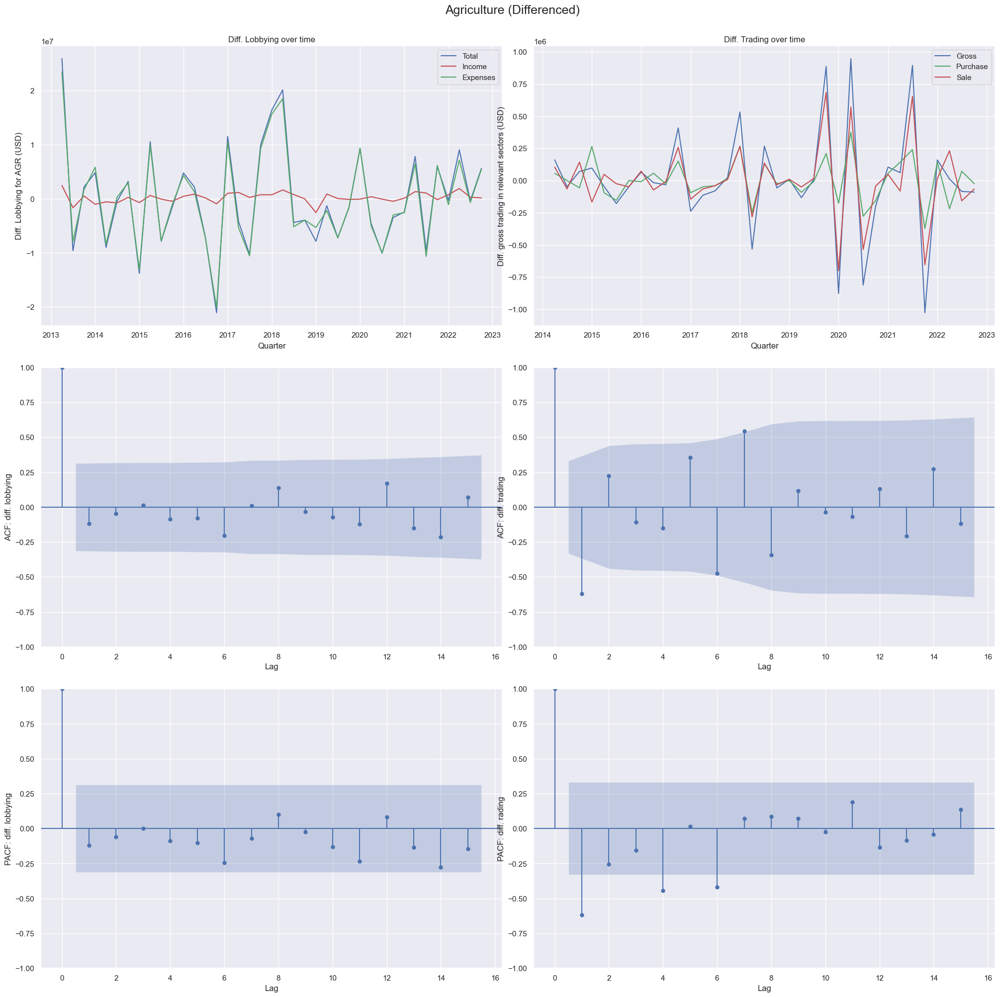

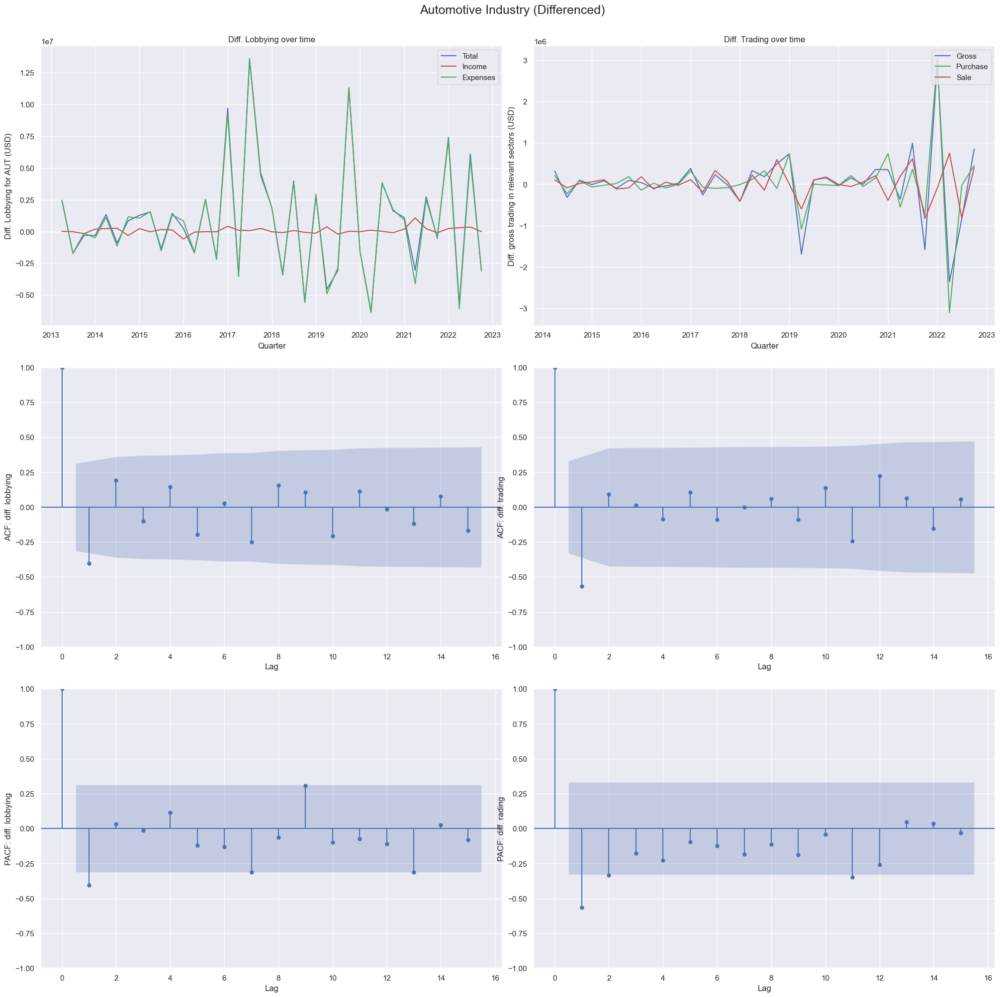

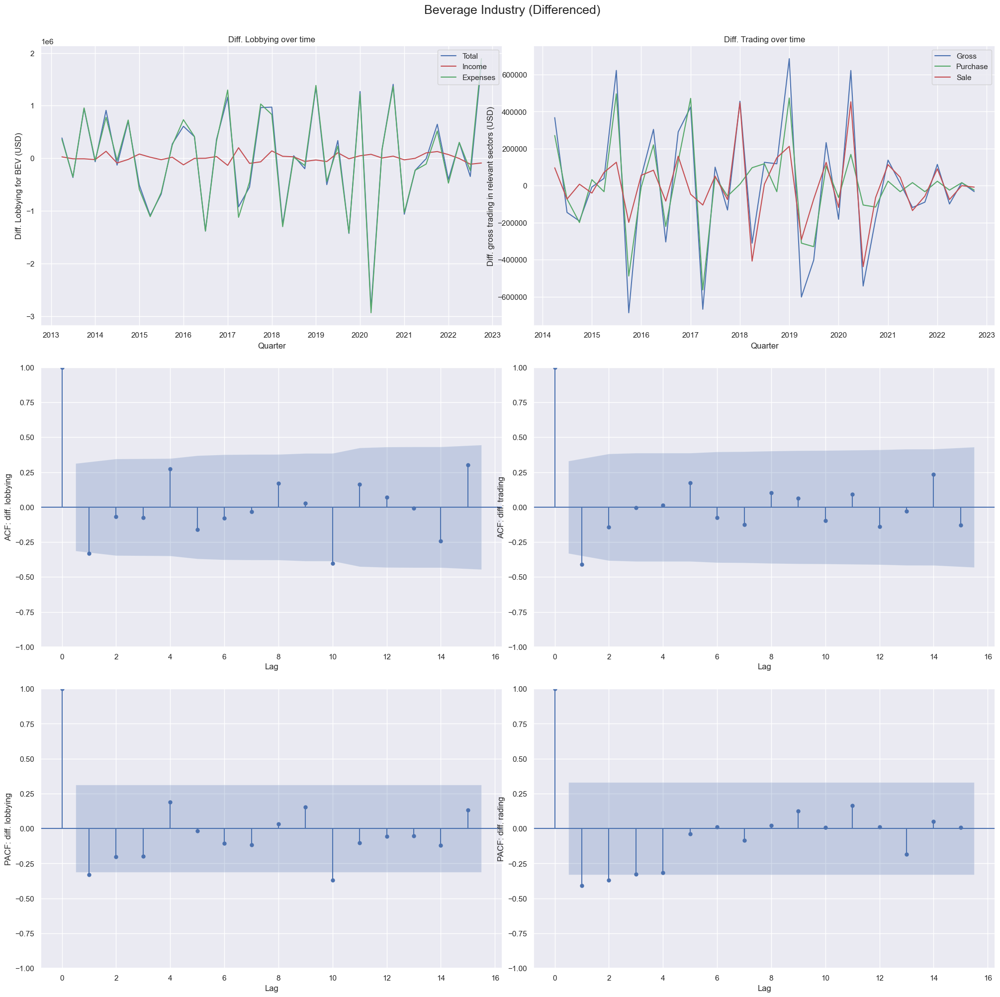

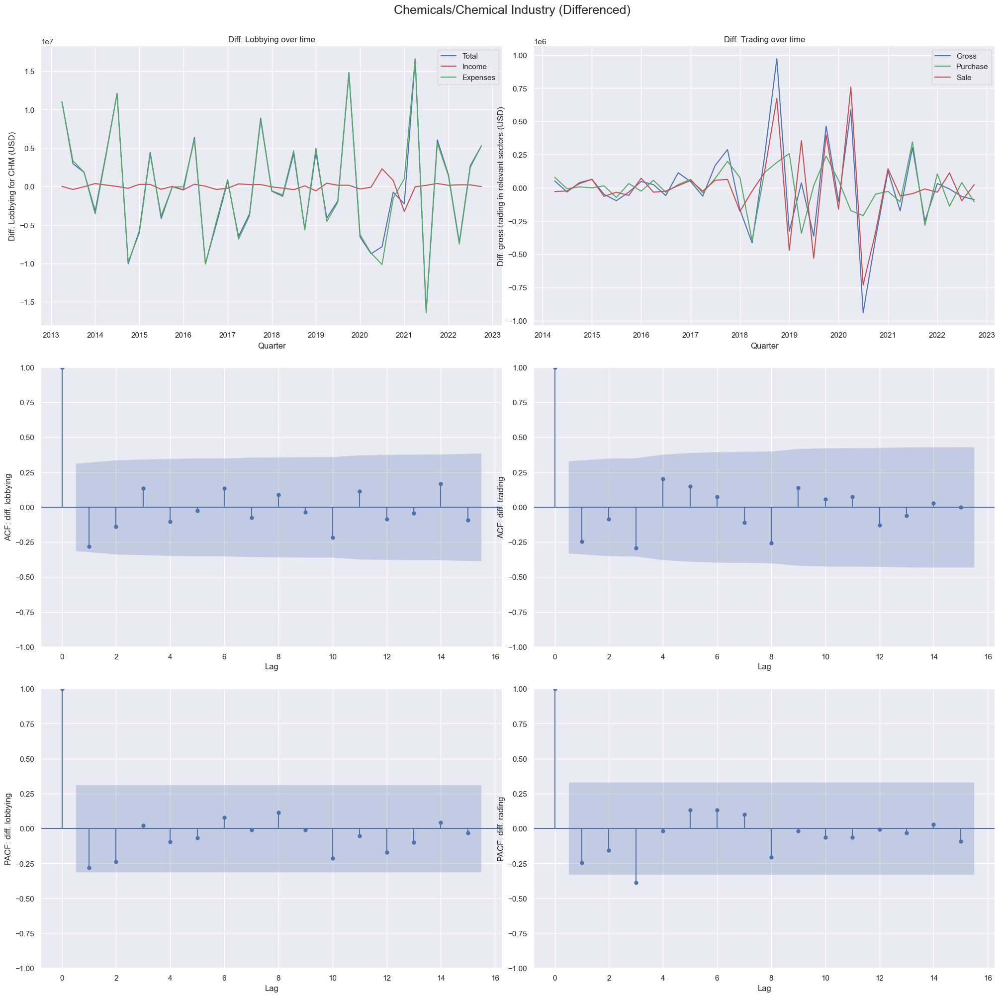

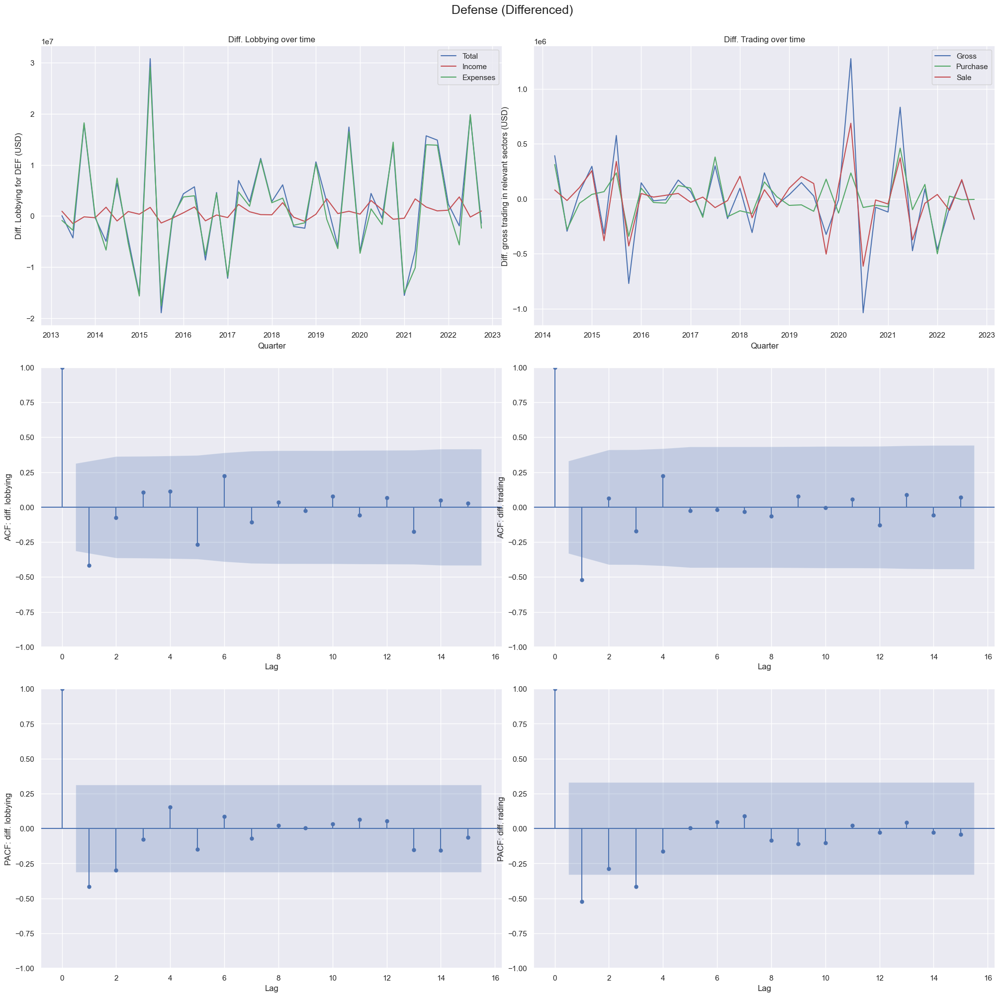

...

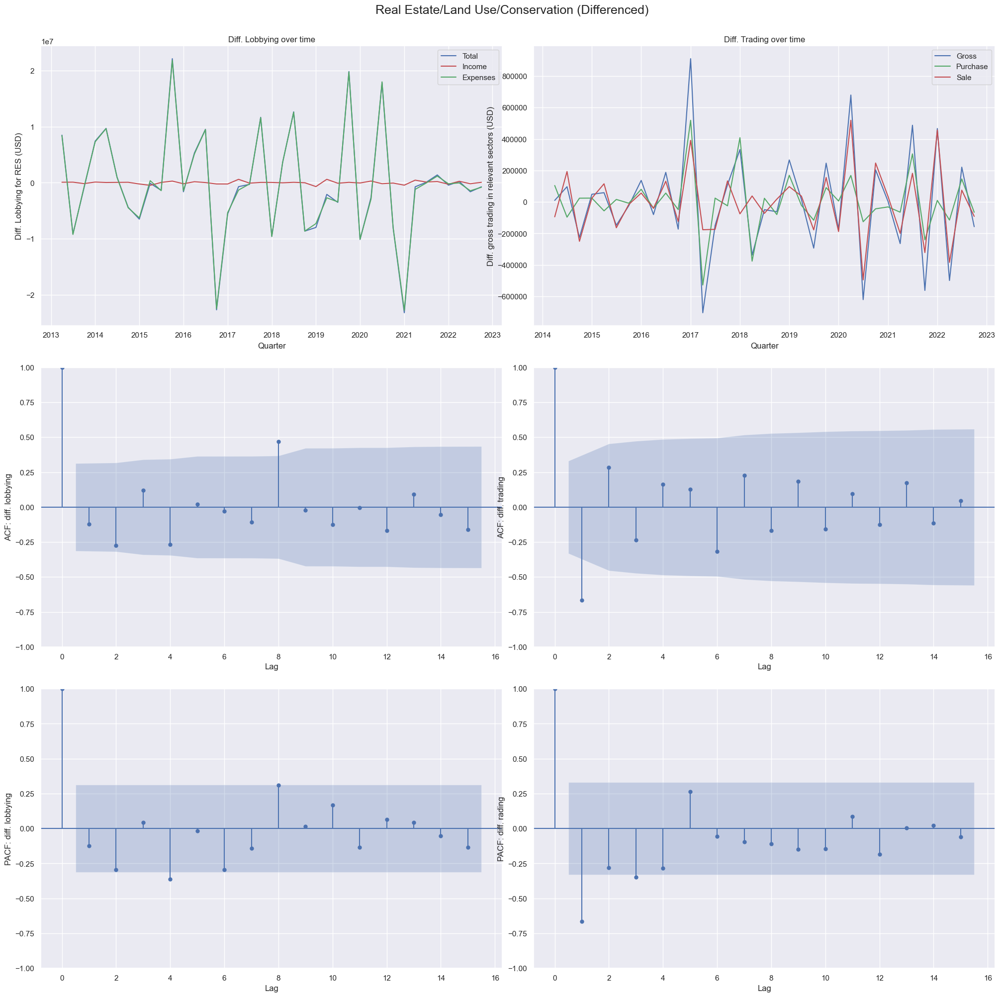

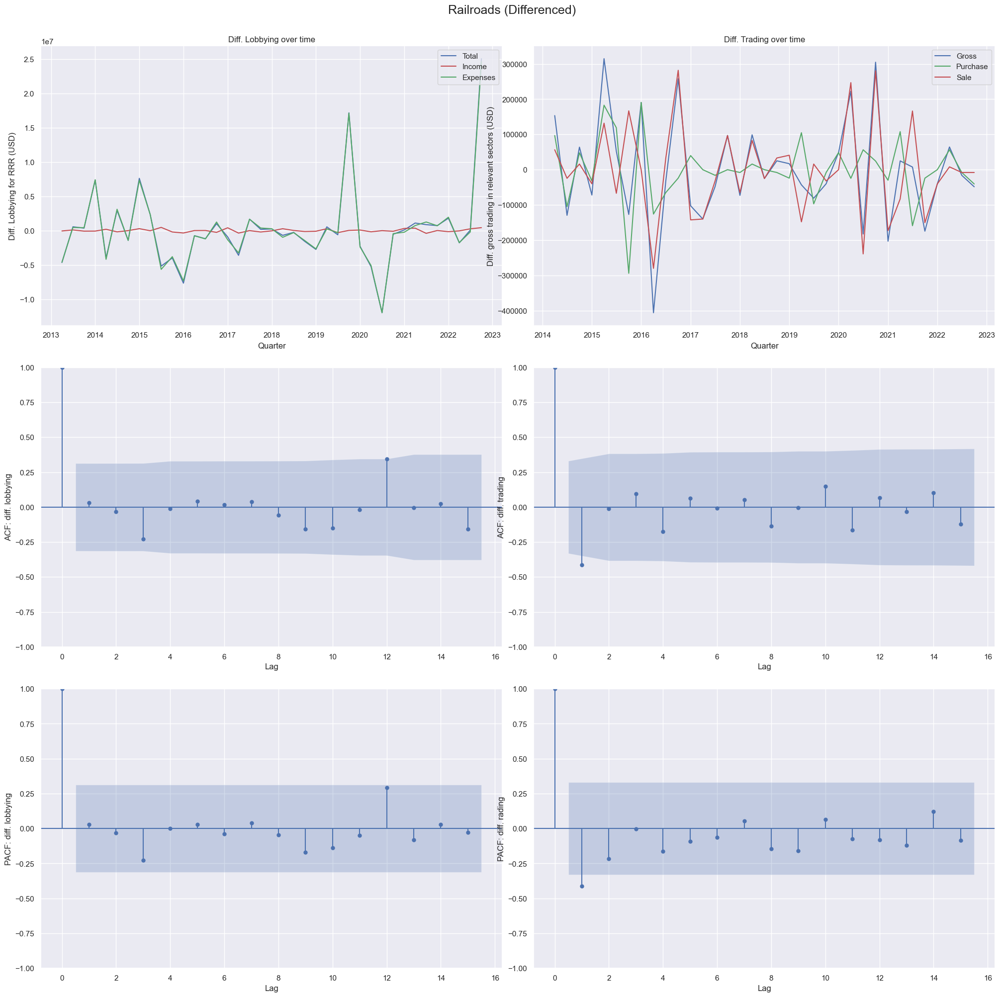

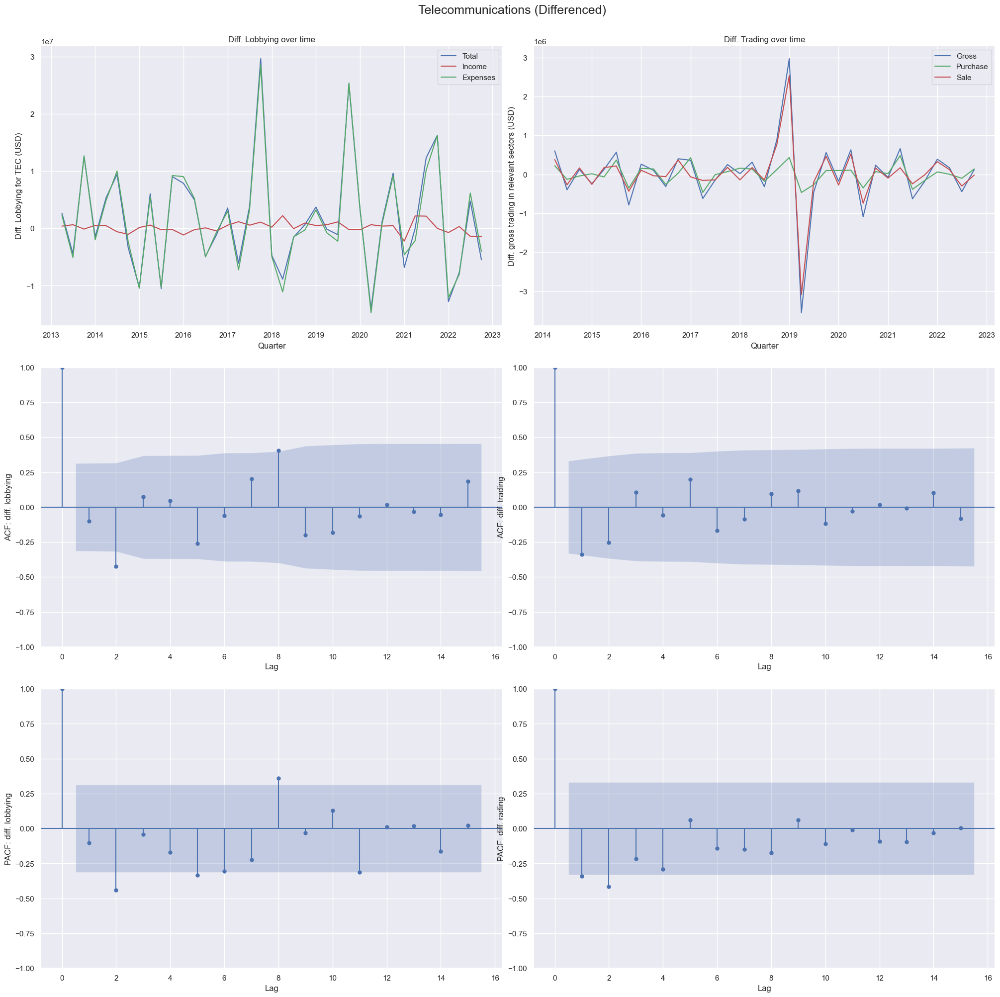

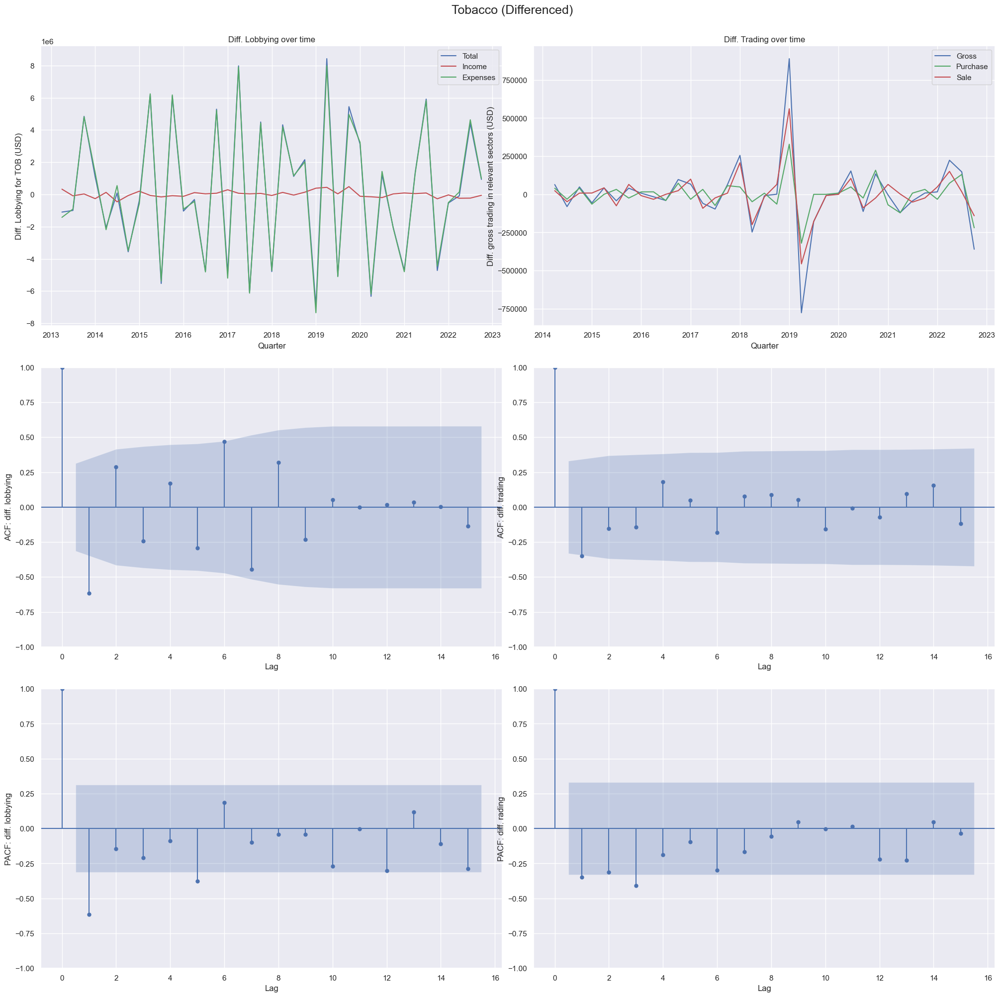

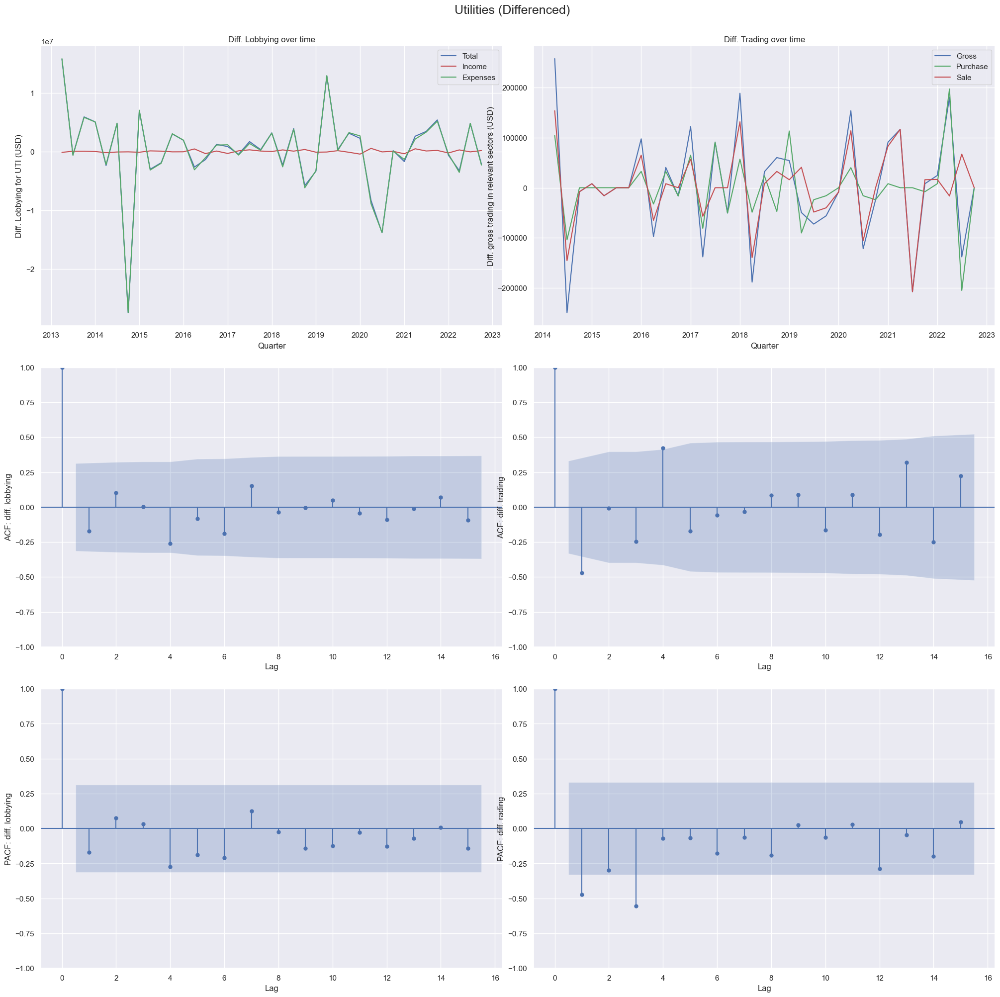

In [86]:
for key in list(cognates.keys()):
    totals=stock_and_lobbying_totals(key, cognates[key])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    diff_lobb=lobbying_totals.diff().dropna()
    diff_stocks=stocks_totals.diff().dropna()
    fig, axs = plt.subplots(3  , 2, figsize=(20,20))
    fig.suptitle(issue_codes[key] +' (Differenced)', ha='center',va='bottom', fontsize=18)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    fig.subplots_adjust(hspace=.15)
    axs[0,0].plot(diff_lobb.index,diff_lobb.lobbying_total, color='b', label='Total')
    axs[0,0].plot(diff_lobb.index,diff_lobb.lobbying_income, color='r', label='Income')
    axs[0,0].plot(diff_lobb.index,diff_lobb.lobbying_expenses, color='g', label='Expenses')
    axs[0,0].set_title("Diff. Lobbying over time")
    axs[0,0].set_ylabel("Diff. Lobbying for " + key +" (USD)")
    axs[0,0].set_xlabel("Quarter")
    axs[0,0].legend(loc="upper right")
    axs[0,1].plot(diff_stocks.index, diff_stocks.stocks_gross, color='b', label='Gross')
    axs[0,1].plot(diff_stocks.index, diff_stocks.stocks_purchase, color='g', label='Purchase')
    axs[0,1].plot(diff_stocks.index, diff_stocks.stocks_sale, color='r', label='Sale')
    axs[0,1].set_title("Diff. Trading over time")
    axs[0,1].set_ylabel("Diff. gross trading in relevant sectors (USD)")
    axs[0,1].set_xlabel("Quarter")
    axs[0,1].legend(loc="upper right")
    sm.graphics.tsa.plot_acf(diff_lobb.lobbying_total, lags = 15, ax=axs[1,0], title=None)
    axs[1,0].set_ylabel("ACF: diff. lobbying")
    axs[1,0].set_xlabel("Lag")
    sm.graphics.tsa.plot_acf(diff_stocks.stocks_gross, lags = 15, ax=axs[1,1], title=None)
    axs[1,1].set_ylabel("ACF: diff. trading")
    axs[1,1].set_xlabel("Lag")
    
    sm.graphics.tsa.plot_pacf(diff_lobb.lobbying_total, lags = 15, ax=axs[2,0], title=None)
    axs[2,0].set_ylabel("PACF: diff. lobbying")
    axs[2,0].set_xlabel("Lag")
    sm.graphics.tsa.plot_pacf(diff_stocks.stocks_gross, lags = 15, ax=axs[2,1], title=None)
    axs[2,1].set_ylabel("PACF: diff. rading")
    axs[2,1].set_xlabel("Lag")
    
    plt.show()

Interestingly, differenced stocks pretty consistently have a significant negative (partial) autocorrelation at lag 1. I have no idea why this appears!

### Correlations between lobbying and stocks

We must example cross-correlations between lobbying and stocks. First, some scatter plots.

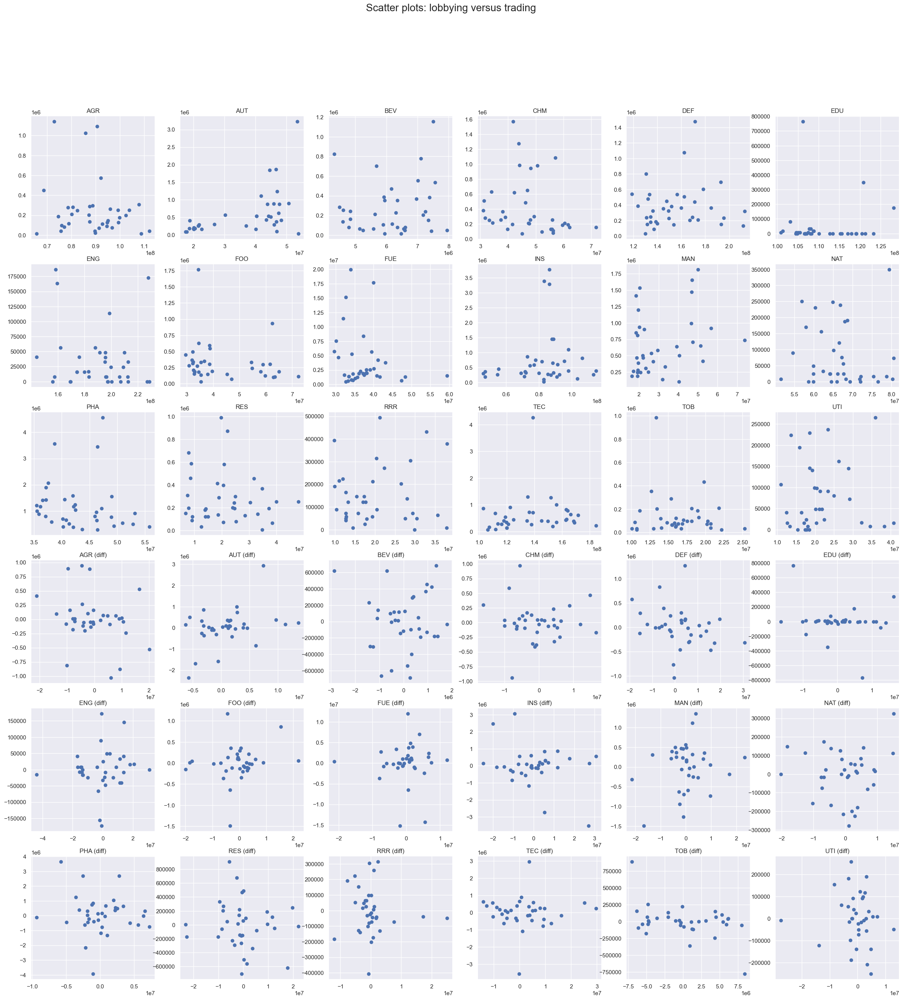

In [8]:
fig, axs = plt.subplots(6, 6, figsize=(30, 30))
axs=axs.flatten()
fig.suptitle('Scatter plots: lobbying versus trading', size=20)
for i, code in enumerate(cognates.keys()):
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    diff_lobb=lobbying_totals.diff().dropna()
    diff_stocks=stocks_totals.diff().dropna()
    axs[i].set_title(code)
    axs[i].scatter(x=lobbying_totals[lobbying_totals.index>=pd.to_datetime("2014-01-01", format="%Y-%m-%d")].lobbying_total, y=stocks_totals.stocks_gross)
    axs[i+18].set_title(code+' (diff)')
    axs[i+18].scatter(x=diff_lobb[diff_lobb.index>=pd.to_datetime("2014-04-01", format="%Y-%m-%d")].lobbying_total, y=diff_stocks.stocks_gross)

These are suggestive of some hidden correlations (I see some straight lines in these pictures!). However, these pictures do not show anything about correlations with lag. Rather than plotting those, let's just compute some cross-correlation functions and look at their plots. Rem: to me, at a glance, the differenced data seem to have more visible lines than the un-differenced. That's odd, but could have some interpretation of lobbying and stock trading being governed by a system of degree 1 differential equations. Seems plausible?

The following defines a Pearson cross-correlation between two lists of numbers.

In [92]:
def ccf(lead,follow, lags): #lead and follow are two lists or list like objects of the same length
    n=len(lead)
    lead=list(lead)
    follow=list(follow)
    cross=[]
    for i in range(lags+1):
        l_1=pd.Series(lead[:n+1-i])
        l_2=pd.Series(follow[i:])
        cross.append(l_1.corr(l_2))
    return cross

In [ ]:
fig, axs = plt.subplots(len(cognates), 6, figsize=(60, 20))
fig.suptitle("Cross-correlation plots by sector, lobbying leading trading", size=20)
expenses_tots = all_totals[expenses_cols].sum().sort_values(ascending=False)[1:]
for i, code in enumerate(cognates.keys()):
    totals=stock_and_lobbying_totals(code, cognates[code])
    lobbying_totals=totals[['lobbying_income', 'lobbying_expenses', 'lobbying_total']]
    stocks_totals=totals[totals.index >= pd.to_datetime("2014-01-01", format="%Y-%m-%d")][['stocks_purchase', 'stocks_sale', 'stocks_gross']]
    diff_lobb=lobbying_totals.diff().dropna()
    diff_stocks=stocks_totals.diff().dropna()
    axs[i,0].set_ylabel(code)
    for j in range(6):
    axs[i,j].stem(lead=totals.lobbying_total, follow=)
    axs[i].scatter(x=lobbying_totals[lobbying_totals.index>=pd.to_datetime("2014-01-01", format="%Y-%m-%d")].lobbying_total, y=stocks_totals.stocks_gross)
    axs[i+18].set_title(code+' (diff)')
    axs[i+18].scatter(x=diff_lobb[diff_lobb.index>=pd.to_datetime("2014-04-01", format="%Y-%m-%d")].lobbying_total, y=diff_stocks.stocks_gross)
    
plt.tight_layout()

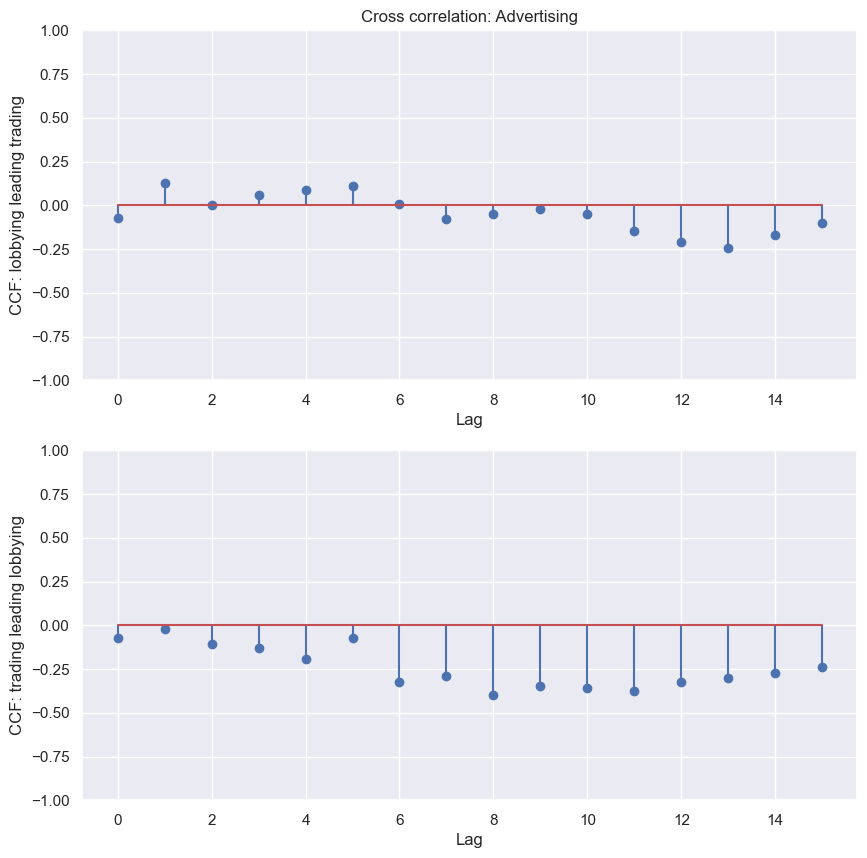

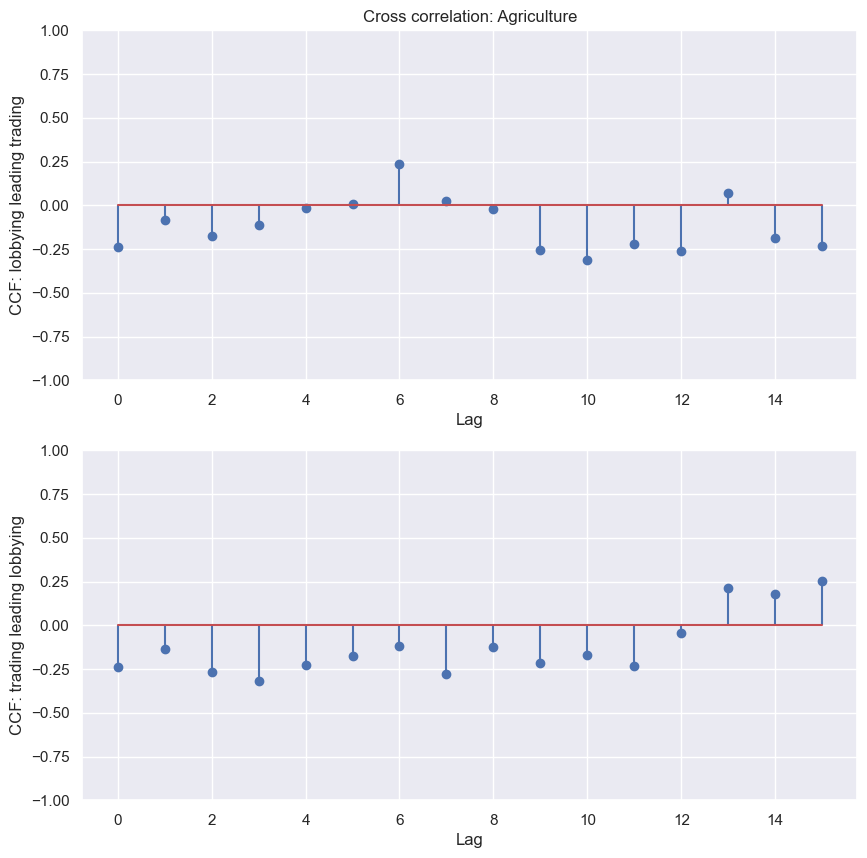

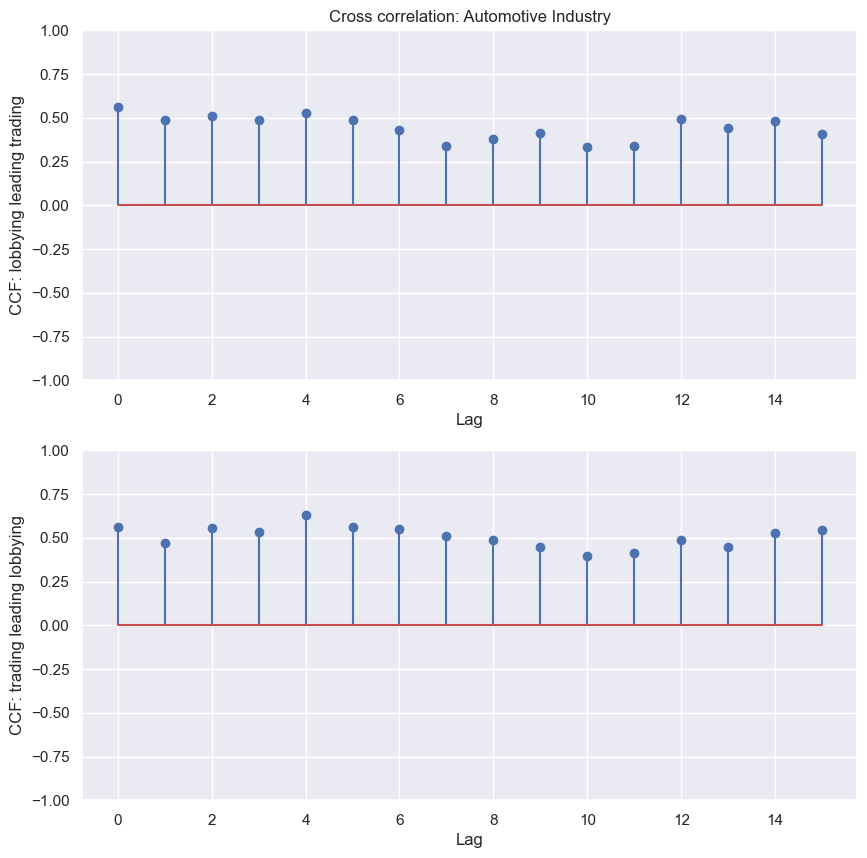

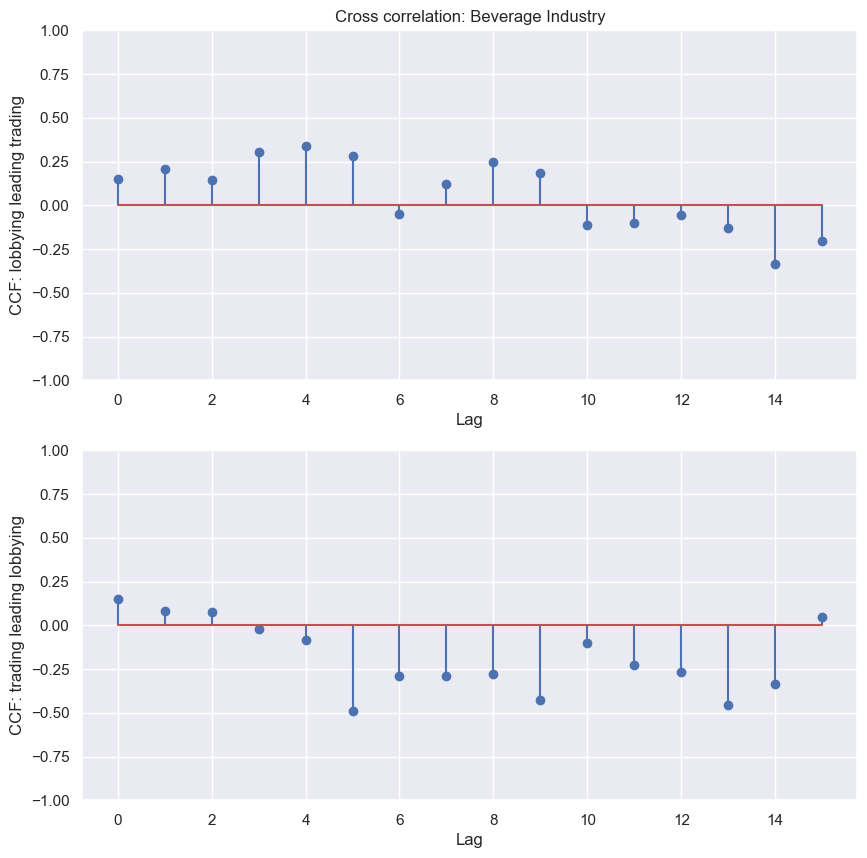

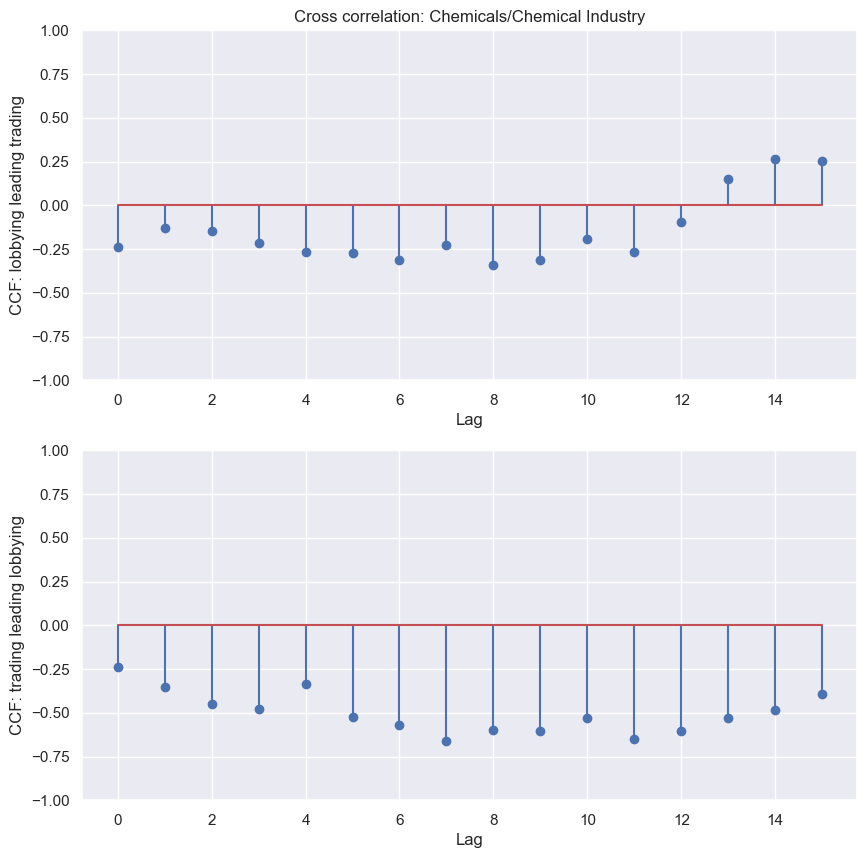

...

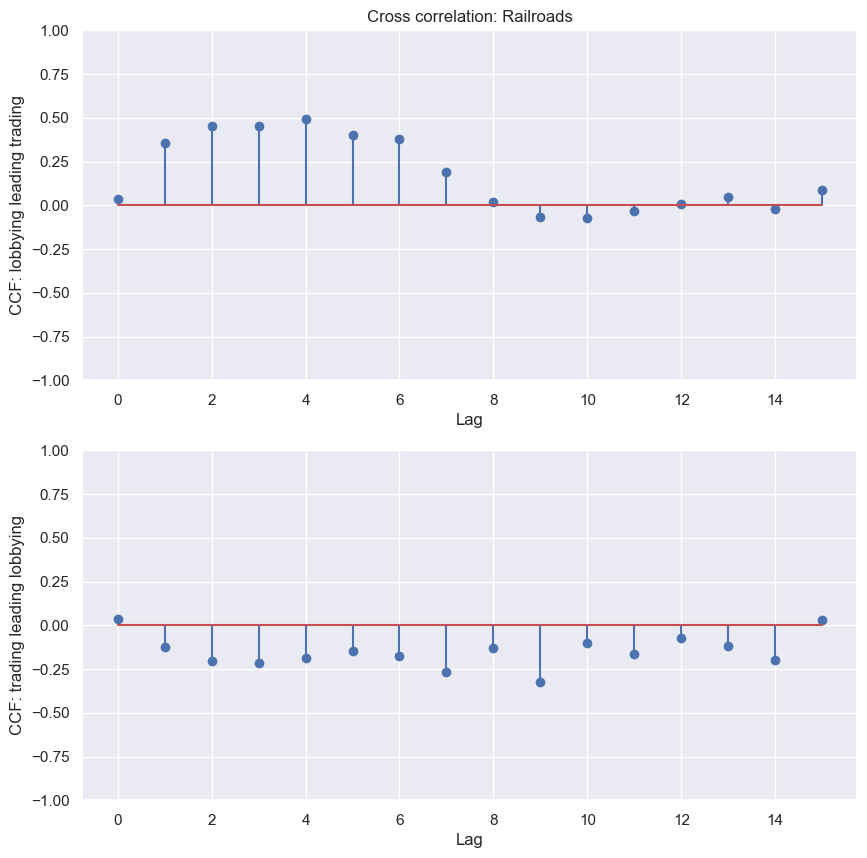

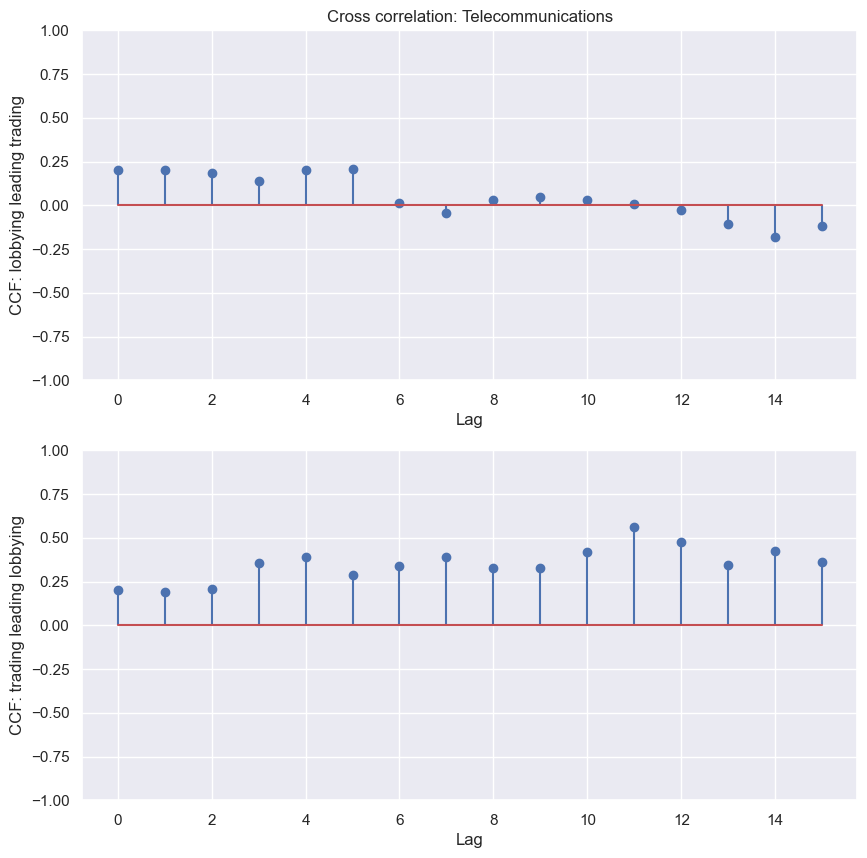

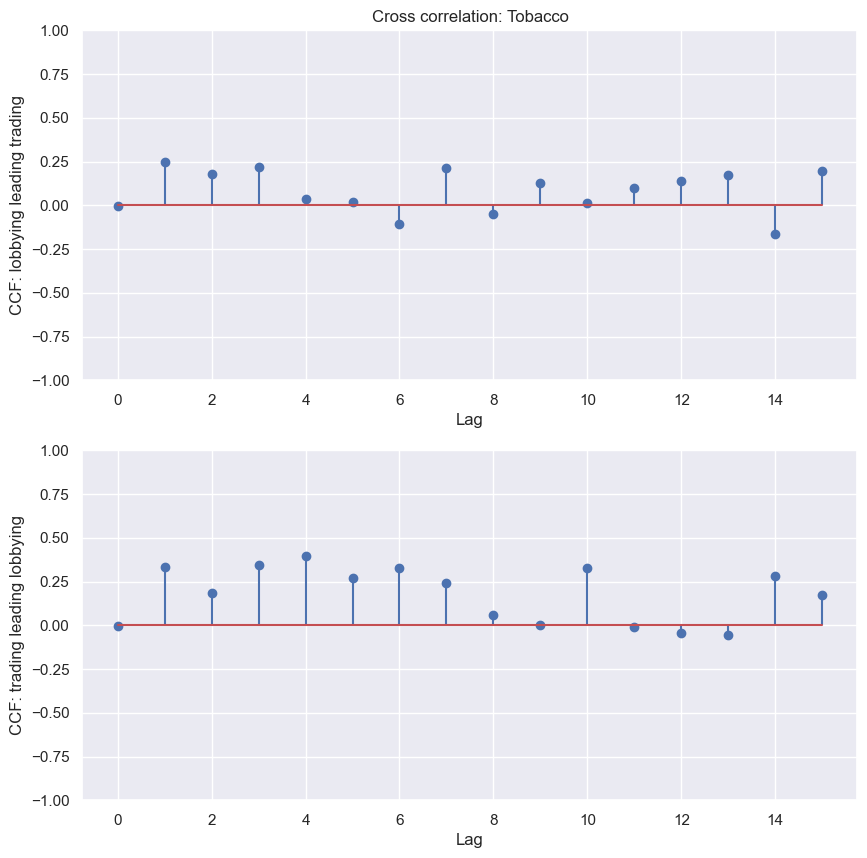

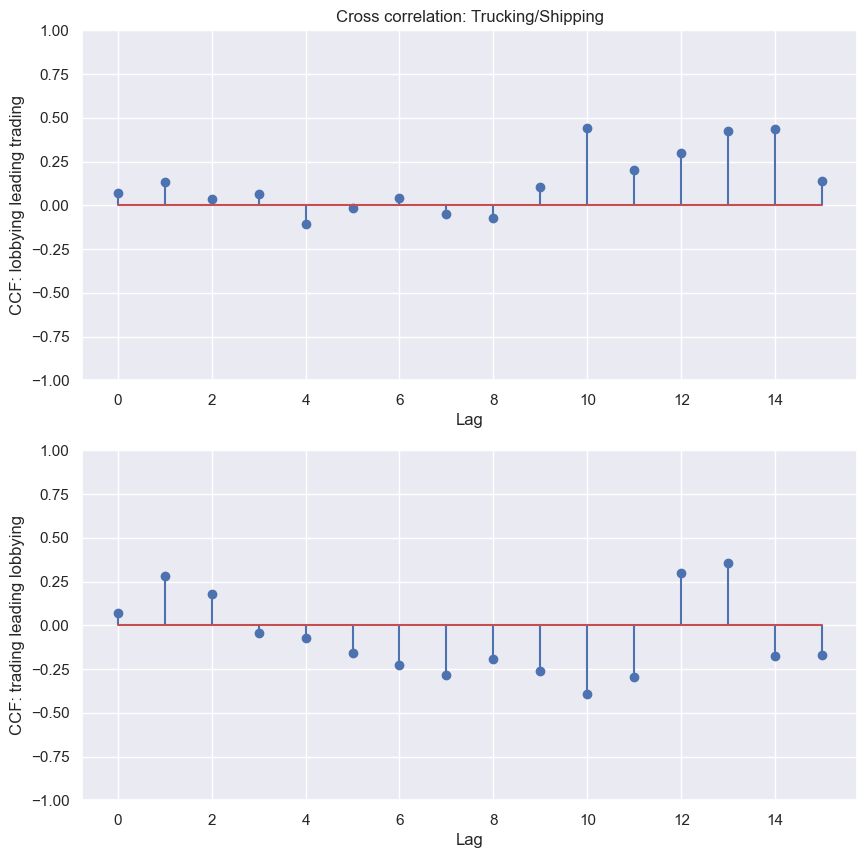

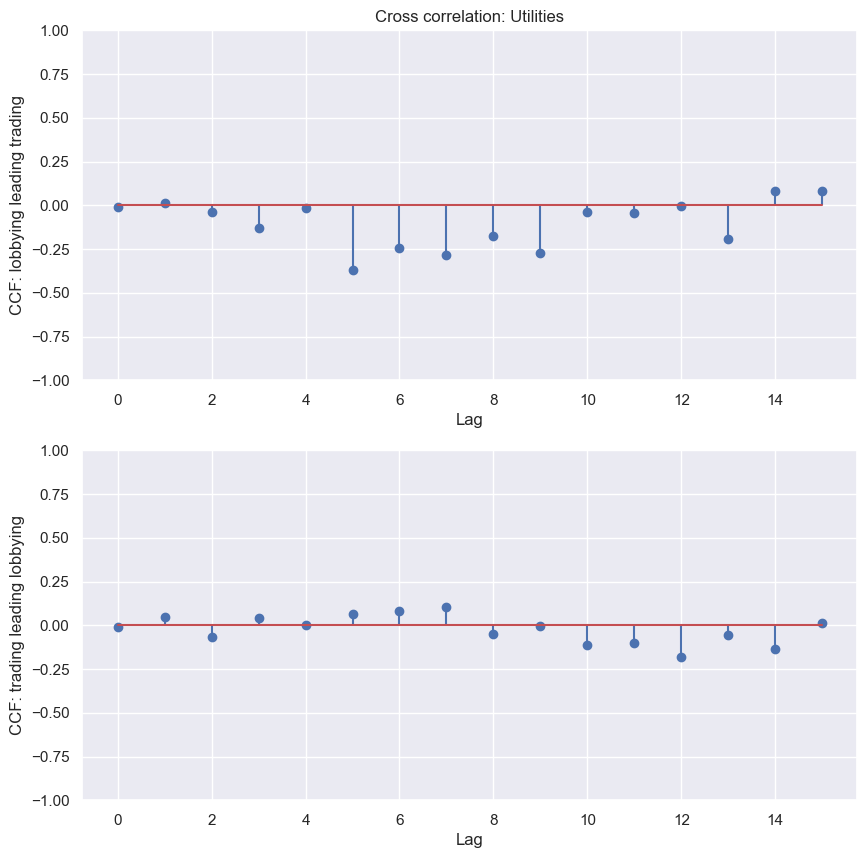

In [93]:
for key in list(cognates.keys()):
    totals= stock_and_lobbying_totals(key, cognates[key])
    fig, axs = plt.subplots(2  , 1, figsize=(10,10))
    axs[0].stem(range(16), ccf(lead=totals.lobbying_total, follow=totals.stocks_gross, lags=15))
    axs[0].set_ylim(bottom=-1, top=1)
    axs[0].set_title("Cross correlation: "+issue_codes[key])
    axs[0].set_ylabel("CCF: lobbying leading trading")
    axs[0].set_xlabel("Lag")
    axs[1].stem(range(16), ccf(lead=totals.stocks_gross, follow=totals.lobbying_total, lags=15))
    axs[1].set_ylabel("CCF: trading leading lobbying")
    axs[1].set_xlabel("Lag")
    axs[1].set_ylim(bottom=-1, top=1)
    plt.show()